# **Proyecto I:** Properati

---

Importamos las librerías necesarias que vamos a utilizar para el análisis de los datos.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
#from google.colab import drive
#drive.mount('/content/drive')

sns.set()
plt.style.use('ggplot')

Cargamos el dataset que vamos a utilizar.

In [3]:
#properati = pd.read_csv('/content/drive/MyDrive/Acámica/Resources/Properati.csv', parse_dates=[2])
properati = pd.read_csv('../Resources/Properati.csv', parse_dates=[2])

Verificamos con que columnas nos encontramos con el dataset y las renombramos para una mejor comprensión de los datos.

In [4]:
column = '\t | '
for name in properati.columns:
    column += f'{ name } | '
print('Los nombres de columnas del dataset son:')
print(column)

Los nombres de columnas del dataset son:
	 | start_date | end_date | created_on | lat | lon | l1 | l2 | l3 | rooms | bedrooms | bathrooms | surface_total | surface_covered | price | currency | title | description | property_type | operation_type | 


In [5]:
# Cambio los nombres de las columnas
properati.rename(columns={ 'start_date' : 'Fecha inicio', 'end_date' : 'Fecha fin', 'created_on' : 'Creación',
                         'lat' : 'Latitud', 'lon' : 'Longitud', 'l1' : 'País', 'l2' : 'Zona', 'l3' : 'Barrio',
                         'rooms' : 'Ambientes', 'bedrooms' : 'Habitaciones', 'bathrooms' : 'Baños',
                         'surface_total' : 'Superficie total', 'surface_covered' : 'Superficie cubierta',
                         'price' : 'Precio', 'currency' : 'Moneda', 'title' : 'Título',
                         'description' : 'Descripción', 'property_type' : 'Tipo de propiedad',
                         'operation_type' : 'Tipo de operación' }, inplace=True)

Verificamos la cantidad de columnas y la totalidad de registros con los que nos encontramos. Imprimimos los primeros 5 registros del dataset.

In [6]:
print('Total de registros: ', properati.shape[0])
print('Cantidad de columnas: ', properati.shape[1])
properati.head()

Total de registros:  146660
Cantidad de columnas:  19


,Fecha inicio,Fecha fin,Creación,Latitud,Longitud,País,Zona,Barrio,Ambientes,Habitaciones,Baños,Superficie total,Superficie cubierta,Precio,Moneda,Título,Descripción,Tipo de propiedad,Tipo de operación
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta


Verificamos los valores nulos que existen y que proporción representan de los datos.

In [7]:
column = ''
for i in properati.columns:
    if properati[i].isna().sum() > 0:
        #isna_count = properati[i].isna().sum()
        cantidad = properati[i].isna().sum()
        total = properati[i].count()
        porcentaje = round(100*cantidad/total, 2)
        column += f'\t{ i } tiene { properati[i].isna().sum() } datos nulos ({ porcentaje }%).\n'
print('Las siguientes columnas tienen valores nulos:')
print(column)

Las siguientes columnas tienen valores nulos:
	Latitud tiene 9925 datos nulos (7.26%).
	Longitud tiene 9959 datos nulos (7.29%).
	Baños tiene 5957 datos nulos (4.23%).
	Superficie total tiene 20527 datos nulos (16.27%).
	Superficie cubierta tiene 21614 datos nulos (17.28%).



In [8]:
properati['País'] = properati['País'].astype('category')
properati['Barrio'] = properati['Barrio'].astype('category')
properati['Zona'] = properati['Zona'].astype('category')
properati['Moneda'] = properati['Moneda'].astype('category')
properati['Tipo de propiedad'] = properati['Tipo de propiedad'].astype('category')
properati['Tipo de operación'] = properati['Tipo de operación'].astype('category')
properati['Título'] = properati['Título'].astype('string')
properati['Descripción'] = properati['Descripción'].astype('string')
properati['Ambientes'] = properati['Ambientes'].astype('int')
properati['Habitaciones'] = properati['Habitaciones'].astype('int')
properati.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146660 entries, 0 to 146659
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   Fecha inicio         146660 non-null  object        
 1   Fecha fin            146660 non-null  object        
 2   Creación             146660 non-null  datetime64[ns]
 3   Latitud              136735 non-null  float64       
 4   Longitud             136701 non-null  float64       
 5   País                 146660 non-null  category      
 6   Zona                 146660 non-null  category      
 7   Barrio               146660 non-null  category      
 8   Ambientes            146660 non-null  int32         
 9   Habitaciones         146660 non-null  int32         
 10  Baños                140703 non-null  float64       
 11  Superficie total     126133 non-null  float64       
 12  Superficie cubierta  125046 non-null  float64       
 13  Precio        

## ANÁLISIS EXPLORATORIO DE DATOS

Comenzamos esta sección analizando y explorando nuestro dataset en detalle. Lo primero que hacemos es utilizar el método ```describe()``` para obtener una lectura estadística de nuestros datos.

In [9]:
properati.iloc[:,8:14].describe()

,Ambientes,Habitaciones,Baños,Superficie total,Superficie cubierta,Precio
count,146660.000000,146660.000000,140703.000000,126133.000000,125046.000000,1.466600e+05
mean,3.079817,1.983240,1.599994,216.872888,112.818011,2.412211e+05
std,1.416352,1.151304,0.889324,2037.606649,916.857584,3.185195e+05
min,1.000000,0.000000,1.000000,10.000000,1.000000,5.500000e+03
25%,2.000000,1.000000,1.000000,52.000000,47.000000,1.110000e+05
50%,3.000000,2.000000,1.000000,78.000000,68.000000,1.660000e+05
75%,4.000000,3.000000,2.000000,140.000000,108.000000,2.650000e+05
max,35.000000,15.000000,14.000000,193549.000000,126062.000000,3.243423e+07


### ANÁLISIS DE VARIABLES **CATEGÓRICAS**

Continuamos nuestro análisis exploratorio de los datos analizando los atributos categóricos para luego continuar con los datos númericos.

#### TIPO DE PROPIEDADES

Verificamos la cuántos tipos de propiedades hay publicadas así como la cantidad de registros publicadas en cada uno y que porcentaje representan del total.

In [10]:
print(f'Existen', len(properati['Tipo de propiedad'].unique()), 'tipos diferentes de propiedades.')
label, count = np.unique(properati['Tipo de propiedad'], return_counts=True)

total_registros = properati['Tipo de propiedad'].count()
labels = 'Cantidad de registros por propiedad:'
for index, item in enumerate(label):
    frmt = f'[{ item }] -> { count[index] } representando el { round(count[index]*100/total_registros, 3) }%.'
    labels += f'\n\t{ frmt }'
print(labels)

Existen 10 tipos diferentes de propiedades.
Cantidad de registros por propiedad:
	[Casa] -> 21521 representando el 14.674%.
	[Casa de campo] -> 322 representando el 0.22%.
	[Cochera] -> 259 representando el 0.177%.
	[Departamento] -> 107326 representando el 73.18%.
	[Depósito] -> 265 representando el 0.181%.
	[Local comercial] -> 325 representando el 0.222%.
	[Lote] -> 1312 representando el 0.895%.
	[Oficina] -> 658 representando el 0.449%.
	[Otro] -> 374 representando el 0.255%.
	[PH] -> 14298 representando el 9.749%.


Realizamos un gráfico de barras para visualizar mejor la información.

In [11]:
def configurar_global(width=2):
    plt.rcParams['axes.facecolor'] = 'white'
    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = width
    plt.rcParams['axes.spines.top'] = False
    plt.rcParams['axes.spines.right'] = False
    plt.rcParams['grid.alpha'] = 0

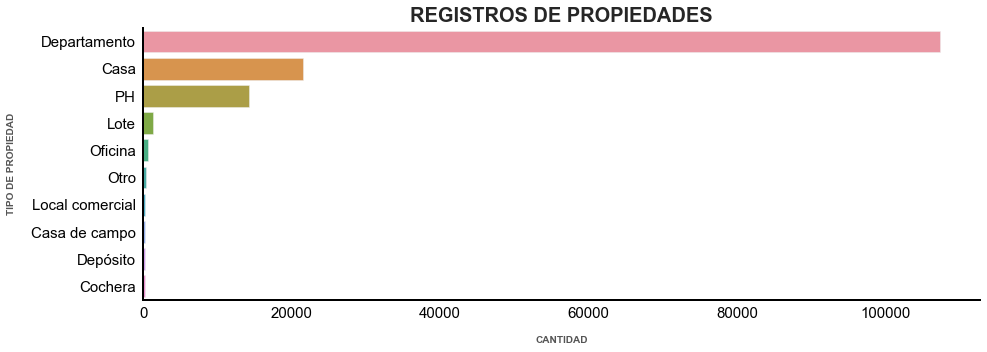

In [12]:
configurar_global()
plt.figure(figsize=(15,5))
sns_plot = sns.countplot(y='Tipo de propiedad', data=properati,
                         order=properati['Tipo de propiedad'].value_counts(ascending=False).index)
plt.title('REGISTROS DE PROPIEDADES', fontsize=20, weight='bold')
plt.tick_params(direction='out', colors='black', length=5, pad=2, width=2)
plt.xlabel('CANTIDAD', fontsize=10, labelpad=15, weight='bold')
plt.xticks(fontsize=15)
plt.ylabel('TIPO DE PROPIEDAD', fontsize=10, labelpad=15, weight='bold')
plt.yticks(fontsize=15)
plt.show()
#sns_plot.figure.savefig('Cant. Propiedades.png')

#### ZONAS

Verificamos la cantidad de zonas existentes en el dataset, la cantidad de registros que tiene cada zona y que porcentaje representan del total.

In [13]:
print(f'Existen', len(properati['Zona'].unique()), 'tipos diferentes de zonas.')
label, count = np.unique(properati['Zona'], return_counts=True)

total_registros = properati['Zona'].count()
labels = 'Cantidad de registros por zona:'
for index, item in enumerate(label):
    frmt = f'[{ item }] -> { count[index] } representando el { round(count[index]*100/total_registros, 2) }%'
    labels += f'\n\t{ frmt }'
print(labels)

Existen 4 tipos diferentes de zonas.
Cantidad de registros por zona:
	[Bs.As. G.B.A. Zona Norte] -> 24282 representando el 16.56%
	[Bs.As. G.B.A. Zona Oeste] -> 12666 representando el 8.64%
	[Bs.As. G.B.A. Zona Sur] -> 17173 representando el 11.71%
	[Capital Federal] -> 92539 representando el 63.1%


Realizamos un gráfico de barras para visualizar la información de manera más amigable.

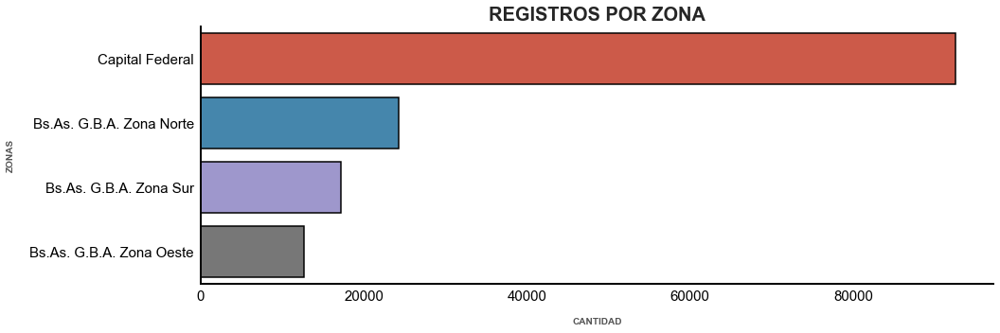

In [14]:
configurar_global()
plt.figure(figsize=(15,5))
plt.tick_params(direction='out', colors='black', length=5, pad=2, width=2)
graph = sns.countplot(y='Zona', data=properati, edgecolor='black', linewidth=1.5,
                    order=properati['Zona'].value_counts(ascending=False).index)
plt.title('REGISTROS POR ZONA', fontsize=20, weight='bold')
plt.xlabel('CANTIDAD', fontsize=10, labelpad=15, weight='bold')
plt.xticks(fontsize=15)
plt.ylabel('ZONAS', fontsize=10, labelpad=15, weight='bold')
plt.yticks(fontsize=15)
plt.show()

#### BARRIOS

Verificamos la cantidad de barrios que existen en el dataset.

In [15]:
print(f'Existen', len(properati['Barrio'].unique()), 'barrios en total.')

Existen 89 barrios en total.


Definimos dos funciónes que nos faciliten realizar los gráficos correspondientes.

In [16]:
# FUNCIÓN PARA GRAFICAR TODOS LOS BARRIOS
def graficar_barrios(datos):
    configurar_global(5)
    # Para adicionar más info al plot
    label, cantidad = np.unique(properati['Zona'], return_counts=True)
    idx = np.argsort(-cantidad)

    label = label[idx]
    cantidad = cantidad[idx]
    labels = []
    for index, item in enumerate(label):
        frmt = f'{ item } ({ cantidad[index] })'
        labels.append(frmt)
    
    plt.figure(figsize=(35,10))
    plt.tick_params(direction='out', colors='black', length=12, pad=6, width=5)
    plt.title('REGISTROS SEGÚN BARRIOS/ZONA', fontsize=40, weight='bold')
    sns.countplot(x='Barrio', hue='Zona', data=datos, dodge=False, edgecolor='black', linewidth=0,
                  order=datos['Barrio'].value_counts(ascending=False).index, saturation=.8)
    plt.legend(borderpad=2, fontsize=20, framealpha=1, frameon=True, loc='upper right', shadow=True,
               title='Zonas', title_fontsize=30, labels=labels)
    plt.xlabel('BARRIOS', fontsize=20, labelpad=20, weight='bold')
    plt.xticks(rotation=90, fontsize=25)
    plt.ylabel('CANTIDAD', fontsize=20, labelpad=20, weight='bold')
    plt.yticks(fontsize=25)
    plt.show()

# FUNCIÓN PARA GRAFICAR LOS BARRIOS DE UNA ZONA PARTICULAR
def graficar_barrio(zona, datos):
    configurar_global(5)
    # CREAMOS UN DICCIONARIO ('KEY': 'VALUE')
    zonas = {
        'cf': 'Capital Federal',
        'zn': 'Bs.As. G.B.A. Zona Norte',
        'zs': 'Bs.As. G.B.A. Zona Sur',
        'zo': 'Bs.As. G.B.A. Zona Oeste'
            }
    colors = {
        'cf' : 'Red',
        'zn' : 'Royalblue',
        'zs' : 'Royalblue',
        'zo' : 'Royalblue',
    }
    # Creamos máscaras para cada barrio
    mask = datos.Zona == zonas[zona]
    barrio, cantidad = np.unique(datos[mask].Barrio.sort_values(ascending=False), return_counts=True)
    index = np.argsort(-cantidad)

    plt.figure(figsize=(30,10))
    plt.bar(x=barrio[index], height=cantidad[index], color=colors[zona], edgecolor='black', linewidth=2)
    plt.title(f'REGISTROS DE { zonas[zona].upper() }', fontsize=40, weight='bold')
    plt.tick_params(direction='out', colors='black', length=12, pad=5, width=4)
    plt.xlabel('BARRIOS', fontsize=22, labelpad=20, weight='bold')
    plt.xticks(fontsize=25, rotation=90)
    plt.ylabel('CANTIDAD', fontsize=22, labelpad=20, weight='bold')
    plt.yticks(fontsize=25)
    plt.show()

**CAPITAL FEDERAL**

Realizamos un gráfico de barra para visualizar los barrios registrados de Capital Federal. Lo ordenamos de manera decreciente.

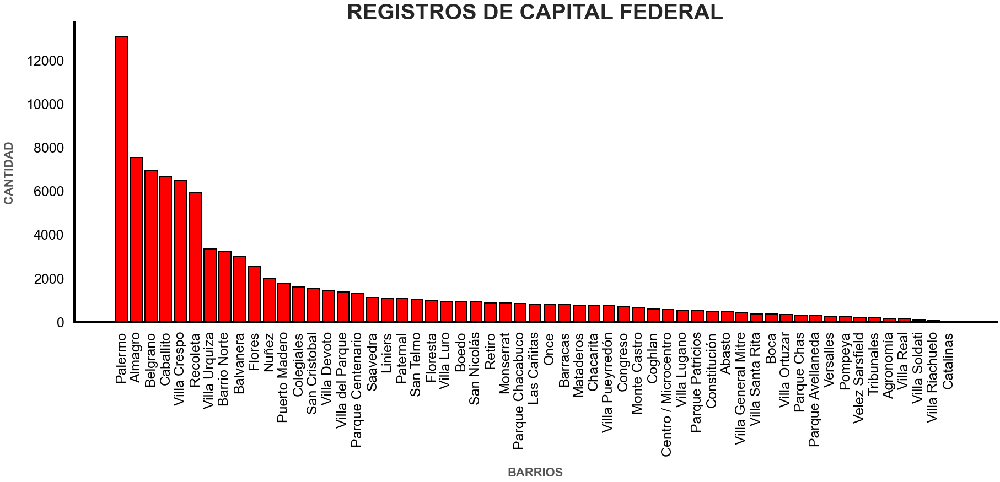

In [17]:
graficar_barrio('cf', properati)

**GRAN BUENOS AIRES: ZONA NORTE**

Realizamos un gráfico de barra para visualizar los barrios registrados de Gran Bs. As.: Zona Norte. Lo ordenamos de manera decreciente.

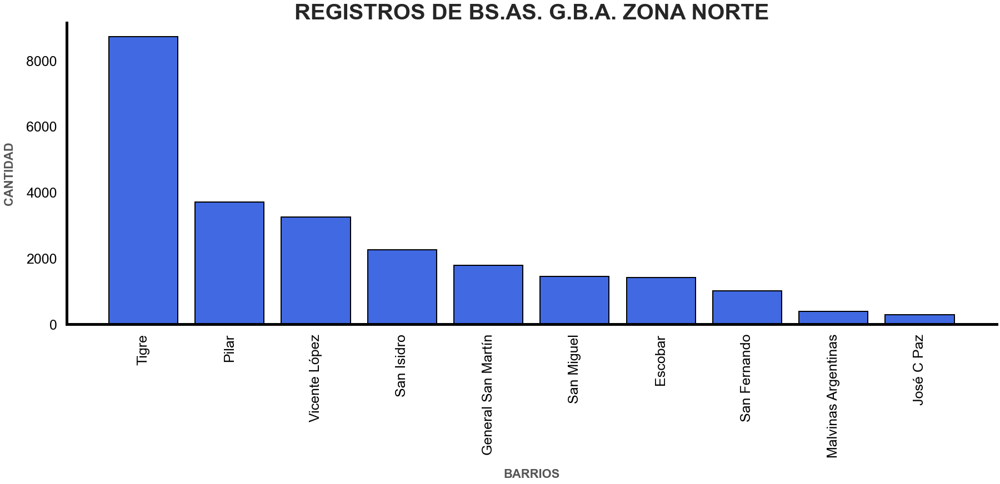

In [18]:
graficar_barrio('zn', properati)

**GRAN BUENOS AIRES: ZONA SUR**

Realizamos un gráfico de barra para visualizar los barrios registrados de Gran Bs. As.: Zona Sur. Lo ordenamos de manera decreciente.

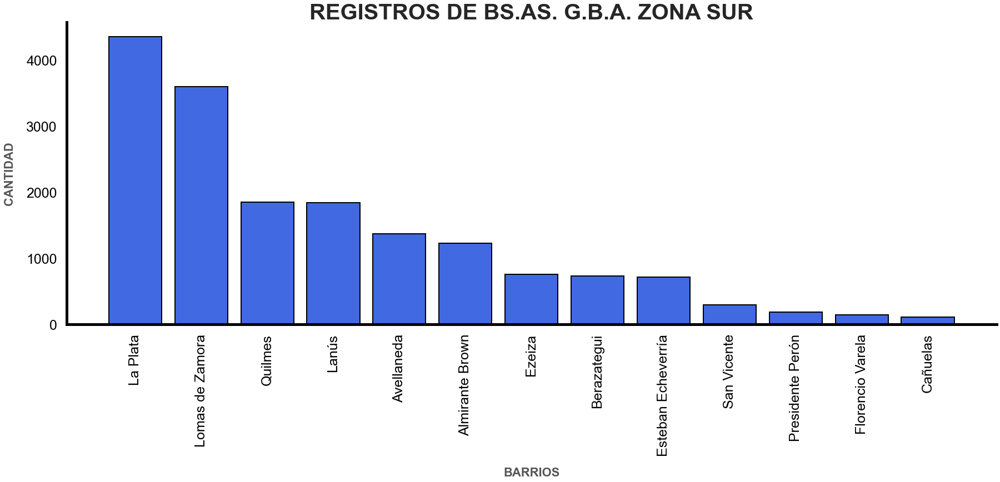

In [19]:
graficar_barrio('zs', properati)

**GRAN BUENOS AIRES: ZONA OESTE**

Realizamos un gráfico de barra para visualizar los barrios registrados de Gran Bs. As.: Zona Oeste. Lo ordenamos de manera decreciente.

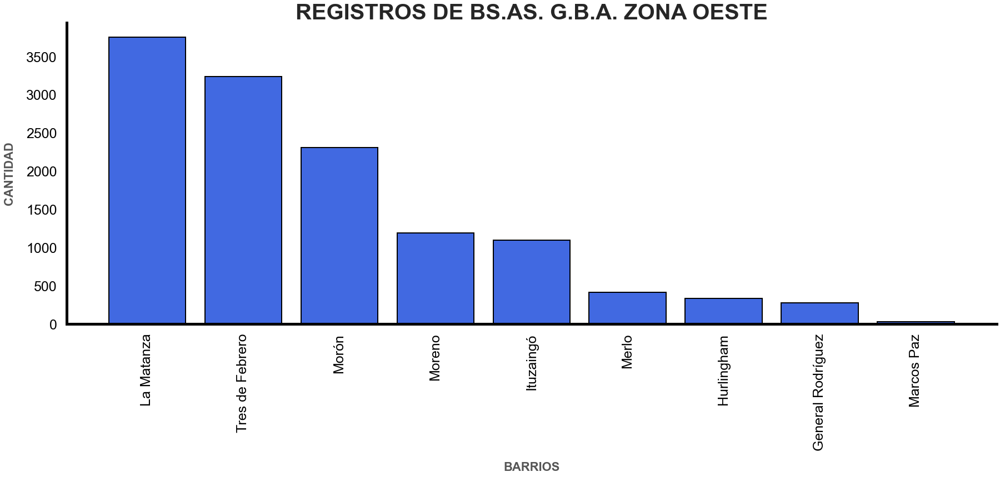

In [20]:
graficar_barrio('zo', properati)

Realizamos un gráfico de barra para visualizar todos los barrios registrados. Distinguimos la zona a la que pertenece cada barrio y también agregamos la cantidad total de registros que existe en cada zona. Lo ordenamos de manera decreciente y verificamos que se condice con los gráficos previos.

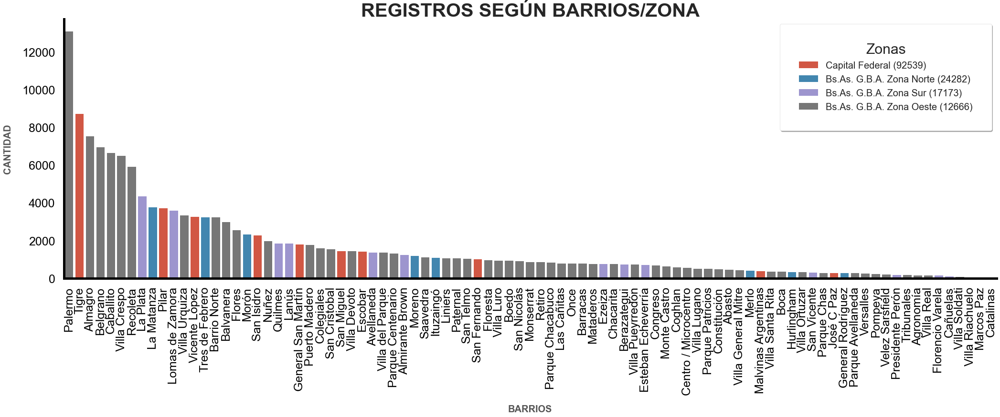

In [21]:
graficar_barrios(properati)

Creamos un subplot de los distintos gráficos que vimos previamente para agruparlo y obtener una mejor compresión.

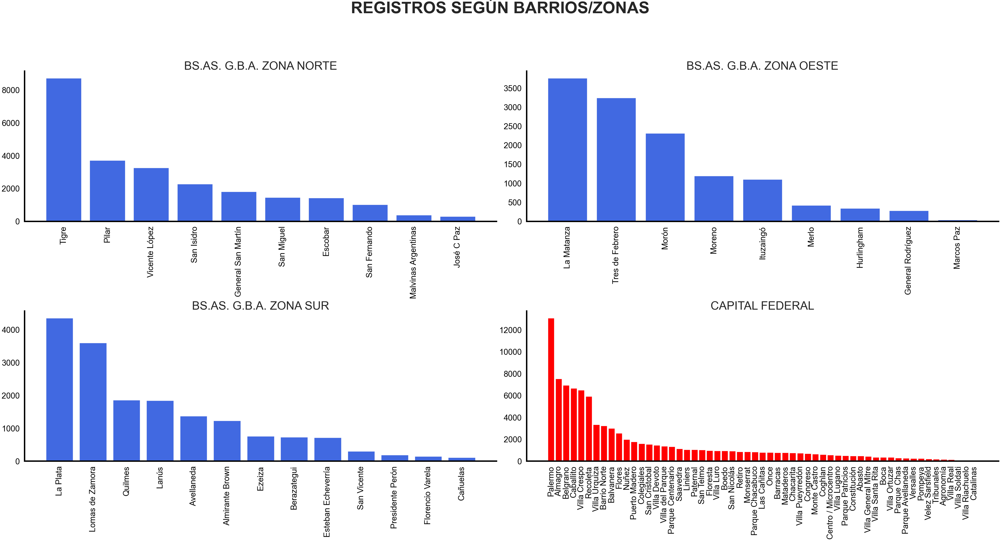

In [22]:
configurar_global(6)
colors = {
    'Capital Federal': 'Red',
    'Bs.As. G.B.A. Zona Norte': 'Royalblue',
    'Bs.As. G.B.A. Zona Sur': 'Royalblue',
    'Bs.As. G.B.A. Zona Oeste': 'Royalblue'
}

zonas = np.unique(properati['Zona'])
contador = 0

fig, axs = plt.subplots(2, 2, figsize=(60,30), tight_layout=True)
for x in range(0,2):
    for y in range(0,2):
        barrio, cantidad = np.unique(properati[properati['Zona'] == zonas[contador]].Barrio, return_counts=True)
        index = np.argsort(-cantidad)
        axs[x][y].bar(x=barrio[index], height=cantidad[index], color=colors[zonas[contador]])
        axs[x][y].set_title(f'{ zonas[contador].upper() }', fontsize=50)
        axs[x][y].tick_params(direction='out', colors='black', length=15, pad=6, width=5)
        axs[x][y].tick_params(axis='x', labelsize=35, labelrotation=90)
        axs[x][y].tick_params(axis='y', labelsize=35)        
        contador += 1
fig.suptitle('REGISTROS SEGÚN BARRIOS/ZONAS', y=1.08, fontsize=70, fontweight='bold')
plt.show()

En está gráfica podemos visualizar lo que hemos analizado anteriormente en relación a los barrios y las zonas pero de forma conjunta. Los registros de **Capital federal** son los que predominan en nuestro dataset y el barrio que destaca de forma cuantitativa es **Palermo**, superando los 12000 registros.

### ANÁLISIS DE VARIABLES **NUMÉRICAS DISCRETAS**

Luego de analizar las variables categóricas, procedemos con las variables numéricas discretas y continuas.

**RANGO INTERCUATÍLICO**

Como *correción* del Proyecto 01, se realiza la eliminación de outliers, tarea que no se encontraba detallada en las consignas generales.

Realizamos una función para quitar los outliers.

In [23]:
def calcular_iqr(data=properati):
    quantiles = stats.mstats.mquantiles(data)
    return quantiles[2] - quantiles[0]

def quitar_outliers(column, data=properati):
    iqr = calcular_iqr(data[column])
    q25, q75 = data[column].quantile(.25), data[column].quantile(.75)
    minimum = (q25 - 1.5 * iqr)
    maximum = (q75 + 1.5 * iqr)
    print(f'{ column.upper() }: Detección y eliminación de outliers (IQR)')
    print(f'-----------------------------------------------------------------')
    print(f'Cant. inferior a Q1: { len(data.query(f"`{ column }` <= @minimum").dropna()) }')
    #print(f'Elementos inferior a Q1: { data.where(data < (q25 - 1.5 * iqr)).dropna() }')
    print(f'Cant. superior a Q3: { len(data.query(f"`{ column }` >= @maximum").dropna()) }\n')
    #print(f'Elementos superiores a Q3: { data.where(data > (q75 + 1.5 * iqr)).dropna() }')
    return data.query(f'`{ column }` >= @minimum & `{ column }` <= @maximum')

Antes de continuar con el el análisis exploratorio de los datos númericos, nos asegurarnos que la ```Superficie cubierta``` no supere a la ```Superficie total```.

In [24]:
pre_chkpoint = properati.copy()
pre_chkpoint = pre_chkpoint.query('`Superficie total` >= `Superficie cubierta`')

Creamos una función que nos va a servir para realizar comparaciónes entre un *diagrama de cajas y bigotes* y un *diagrama de barras* o un *diagrama de densidad*. La utilizamos para variables númericas y variables categóricas.

In [25]:
def graficar_comparacion(data, columna, kde=False):
    configurar_global(5)
    fig, axs = plt.subplots(1, 2, figsize=(30,15), tight_layout=True)
    
    order = data.groupby(by=['Tipo de propiedad'])[columna].median().sort_values(ascending=False).index
    sns.boxplot(x='Tipo de propiedad', y=columna, data=data, color='Coral', fliersize=5, linewidth=4,
                order=order, saturation=1, ax=axs[0])
    #axs[0].set_title(f'BOXPLOT', fontsize=40, weight='bold')
    axs[0].tick_params(direction='out', colors='black', length=12, pad=6, width=4)
    axs[0].tick_params(axis='both', labelsize=35)
    axs[0].tick_params(axis='x', rotation=90)
    axs[0].set_xlabel('TIPO DE PROPIEDAD', fontsize=25, labelpad=20, weight='bold')
    axs[0].set_ylabel(f'{ columna.upper() } ', fontsize=25, labelpad=20, weight='bold')
    
    if (kde):
        sns.kdeplot(data[columna], color='Royalblue', linewidth=4, shade=True, ax=axs[1])
        #sns.distplot(data[columna], bins=35, kde=True, kde_kws={ 'color': 'royalblue',
        #                                                         'linewidth': 6 }, ax=axs[1])
        #axs[1].set_title(f'DISPLOT', fontsize=40, weight='bold')
        axs[1].tick_params(direction='out', colors='black', length=12, pad=6, width=4)
        axs[1].tick_params(axis='both', labelsize=35)
        axs[1].tick_params(axis='x', rotation=90)
        axs[1].set_xlabel(f'{ columna.upper() }', fontsize=25, labelpad=20, weight='bold')
        axs[1].set_ylabel('PROBABILIDAD', fontsize=25, labelpad=20, weight='bold')
    else:       
        sns.barplot(y=columna, x='Tipo de propiedad', data=data, ci='sd', color='Royalblue',
                    order=order, saturation=1, ax=axs[1])
        #axs[1].set_title(f'BARPLOT', fontsize=40, weight='bold')
        axs[1].tick_params(direction='out', colors='black', length=12, pad=6, width=4)
        axs[1].tick_params(axis='both', labelsize=35)
        axs[1].tick_params(axis='x', rotation=90)
        axs[1].set_xlabel('TIPO DE PROPIEDAD', fontsize=25, labelpad=20, weight='bold')
        axs[1].set_ylabel(f'{ columna.upper() }', fontsize=25, labelpad=20, weight='bold')
    fig.suptitle(f'ANÁLISIS DE {columna.upper() }', y=1.05, fontsize=40, fontweight='bold')

#### AMBIENTES

Analizamos los datos almacenados de los ambientes y verificamos dónde debemos establecer algún filtro.

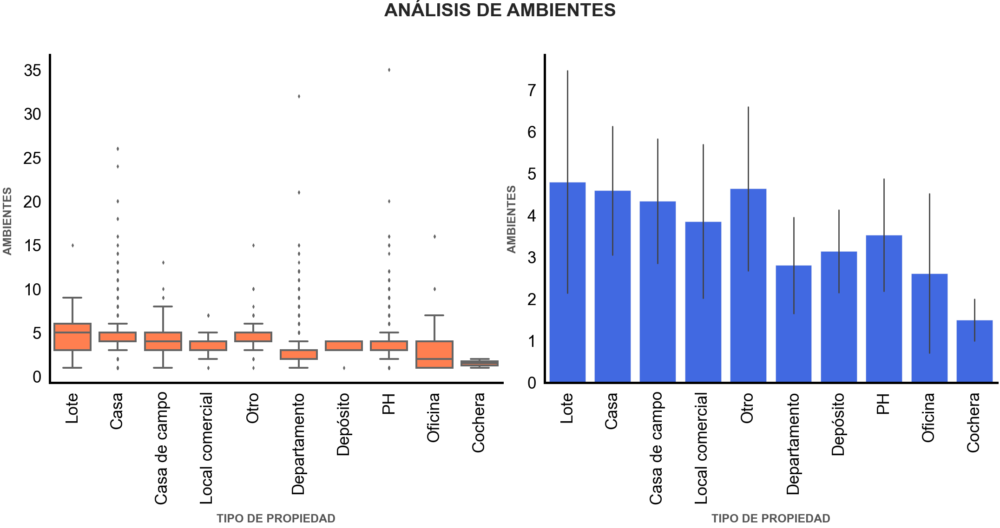

In [26]:
graficar_comparacion(pre_chkpoint, 'Ambientes')

Teniendo en cuenta los diagramas desplegados previamente sobre el atributo **AMBIENTES**, realizamos un filtrado de outliers utilizando la técnica de *rango intercuartílico*, de este modo, eliminamos el ruido que se presentan en este atributo.

AMBIENTES: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 2519



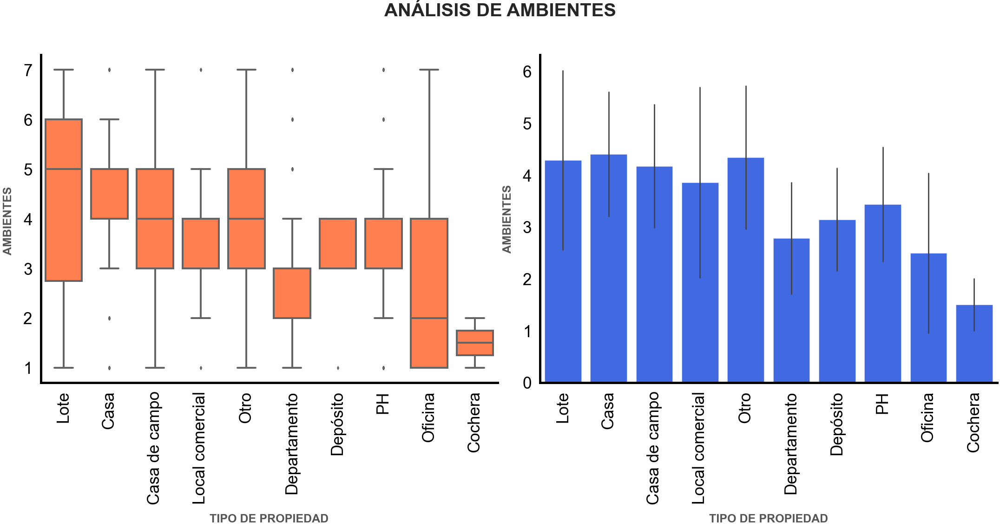

In [27]:
data = quitar_outliers('Ambientes', pre_chkpoint)
graficar_comparacion(data, 'Ambientes')

Al analizar la distribución de ambientes según el tipo de propiedad nos encontramos que las categorías *lote*, *otro*, *casa de campo* y *oficina*, presentan mayor dispersión en comparación a los demás, a su vez, las categorías *lote* y *oficina* presentan un sesgo (asimetría negativa y asimetría positiva respectivamente).

#### BAÑOS

Analizamos los datos almacenados de los baños y verificamos dónde debemos establecer algún filtro.

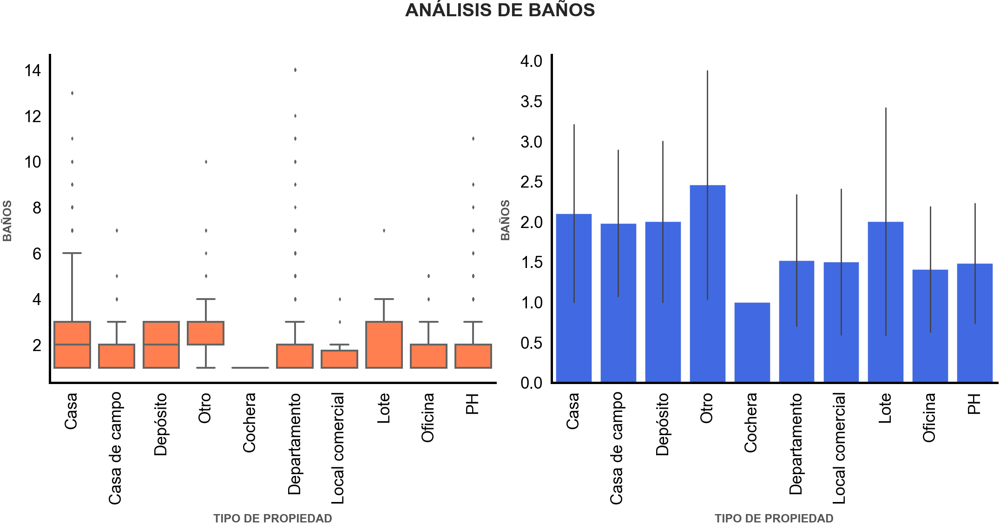

In [28]:
graficar_comparacion(pre_chkpoint, 'Baños')

Teniendo en cuenta los diagramas desplegados previamente sobre el atributo **BAÑOS**, realizamos un filtrado de outliers utilizando la técnica de *rango intercuartílico*, de este modo, eliminamos el ruido que se presentan en este atributo.

BAÑOS: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 4010



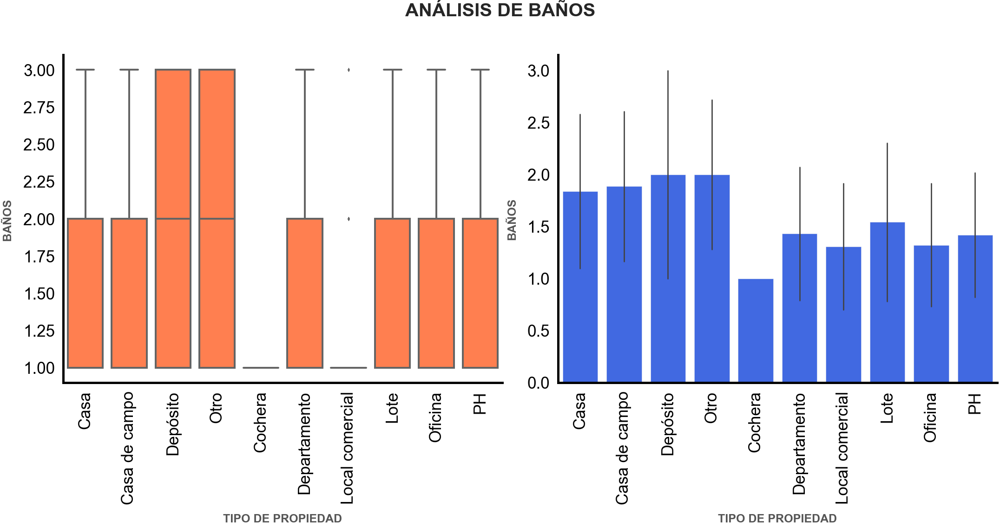

In [29]:
data = quitar_outliers('Baños', pre_chkpoint)
graficar_comparacion(data, 'Baños')

Analizando el atributo baños para los diferentes tipos de propiedades nos encontramos que las distribuciones son bastante similares salvo casos excepcionales.
Las categorías *cochera* y *local comercial* cuentan con la mediana en un baño, las restantes propiedades presentan el primer cuartil coincidiendo con la mediana o el tercer cuartil coincidiendo con la mediana, valores que pueden ser uno o dos baños respectivamente.
Las categorías *depósito* y *otro* nos presentan una mediana de dos, el primer cuartil en uno y el tercer cuartil en tres, son las que mayor distribución tienen.

#### HABITACIONES

Analizamos los datos almacenados de los habitaciones y verificamos dónde debemos establecer algún filtro.

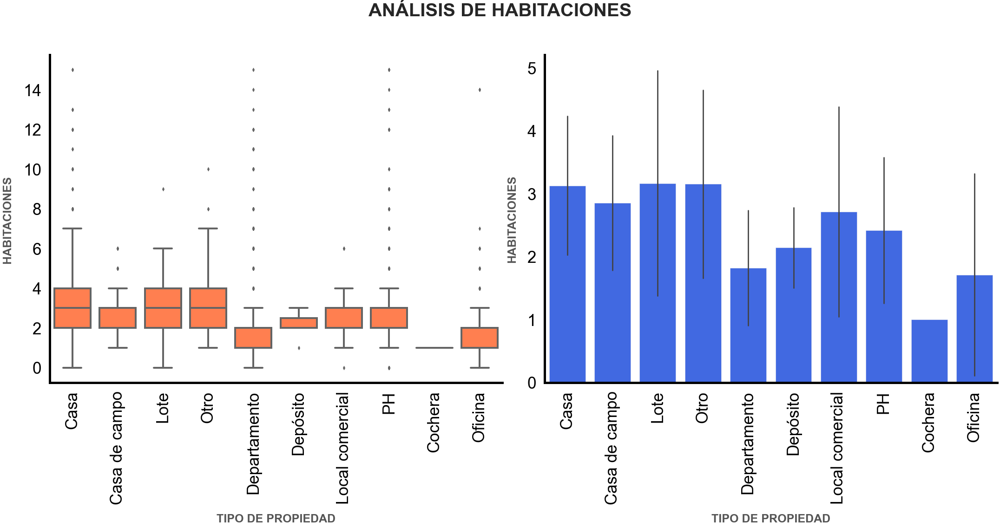

In [30]:
graficar_comparacion(pre_chkpoint, 'Habitaciones')

Teniendo en cuenta los diagramas desplegados previamente sobre el atributo **HABITACIONES**, realizamos un filtrado de outliers utilizando la técnica de *rango intercuartílico*, de este modo, eliminamos el ruido que se presentan en este atributo.

HABITACIONES: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 852



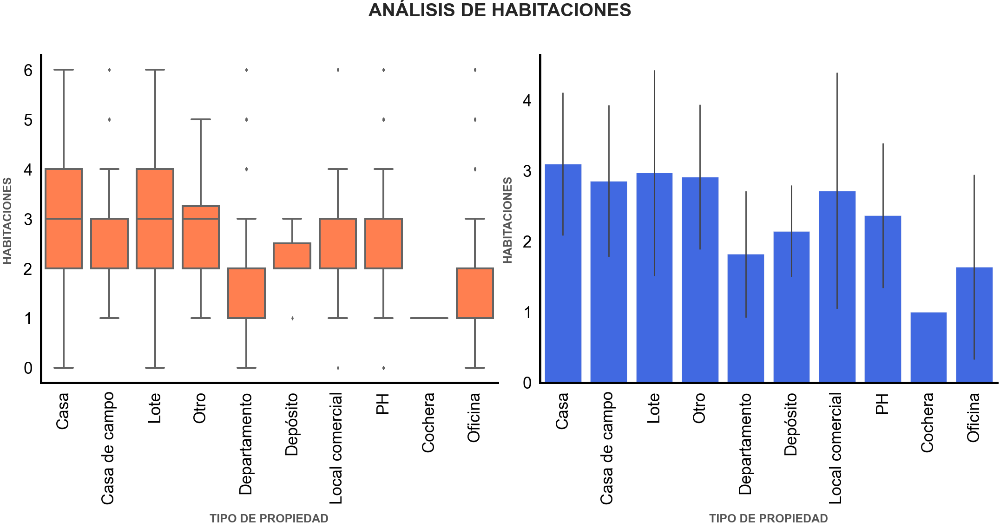

In [31]:
data = quitar_outliers('Habitaciones', pre_chkpoint)
graficar_comparacion(data, 'Habitaciones')

Nos encontramos con que la categoría *otro* tiene un sesgo negativo, la distribución de la categoría *casa* es mayor a la de *departamento*; la mediana de la categoría *casa* es mayor a la de *departamento*. A su vez, notamos como los monoambientes juegan su papel ya que existen registros tipo *casa* y tipo *departamento* sin habitaciones.

### ANÁLISIS DE VARIABLES **NÚMERICAS CONTINUAS**

Antes de continuar con el análisis de las variables númericas continuas, recordemos que previamente establecimos que la superficie cubierta tiene que ser menor o igual a la superficie total.
```python
pre_chkpoint.query('`Superficie total` >= `Superficie cubierta`', inplace=True)
```
También hay que tener en cuenta, que al ser variables númericas continuas, vamos a utilizar un gráfico de histogramas.

#### SUPERFICIE TOTAL

Analizamos los registros de la superficie total para verificar si debemos establecer algún recortes.

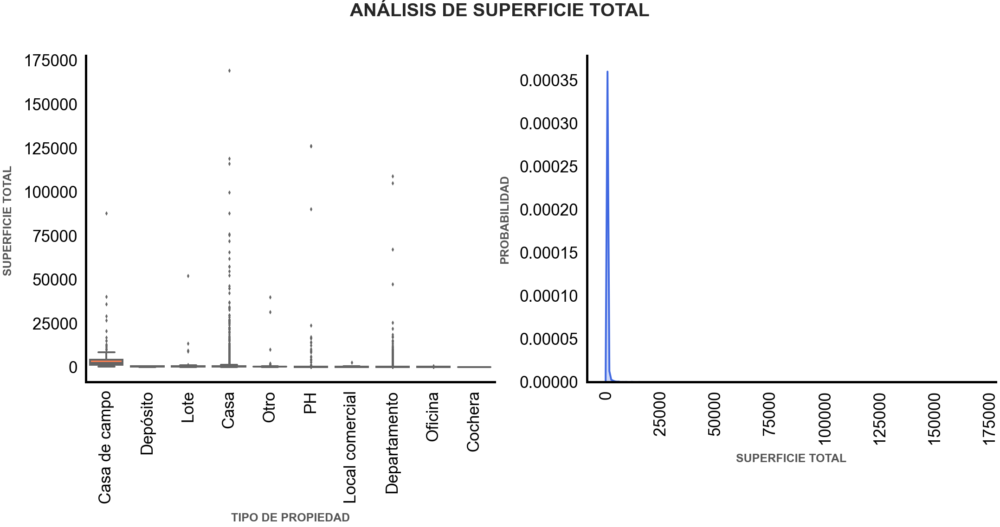

In [32]:
graficar_comparacion(pre_chkpoint, 'Superficie total', True)

Teniendo en cuenta los diagramas desplegados previamente sobre el atributo **SUPERFICIE TOTAL**, volvemos a recurrir un filtrado de outliers utilizando la técnica de *rango intercuartílico*, de este modo, eliminamos el ruido que se presentan en este atributo.

SUPERFICIE TOTAL: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 11787



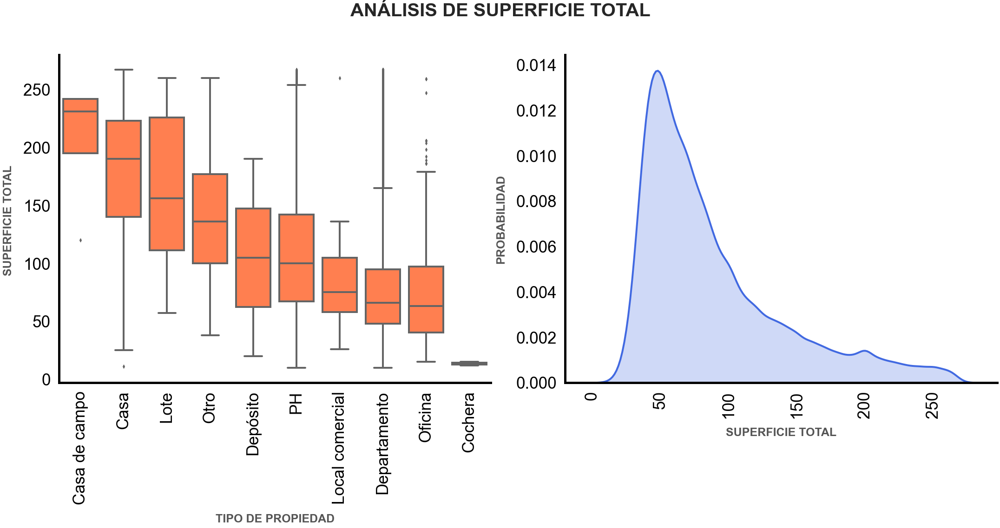

In [33]:
data = quitar_outliers('Superficie total', pre_chkpoint)
graficar_comparacion(data, 'Superficie total', True)

Habiendo realizado un filtrado de outliers al atributo que estamos analizando, nos encontramos con valores atípicos en las categorías *departamento* y *ph*. Aquí visualizamos como las categorías *casa de campo* y *casa* tienen una mediana superior a las categorías restantes. También, se visualiza una tendencia descendente de las medianas, cosa que podemos constrastar en el gráfico de densidad.
En el gráfico de densidad podemos destacar como nuestros datos se concentran en un rango que abarca desde los 45 mts<sup>2</sup> a 100 mts<sup>2</sup>, habiendo mayor dispersión hacia la derecha, donde encontramos valores superiores a dicho rango.

#### SUPERFICIE CUBIERTA

Realizamos el mismo proceso para la superficie cubierta.

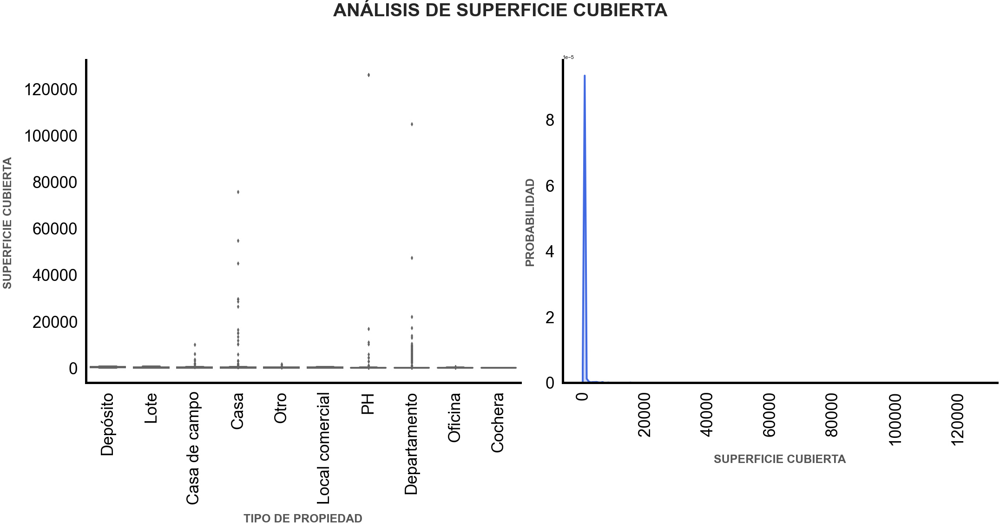

In [34]:
graficar_comparacion(pre_chkpoint, 'Superficie cubierta', True)

Teniendo en cuenta los diagramas desplegados previamente sobre el atributo **SUPERFICIE CUBIERTA**, realizamos un filtrado de outliers utilizando la técnica de *rango intercuartílico*, de este modo, eliminamos el ruido que se presentan en este atributo.

SUPERFICIE CUBIERTA: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 8846



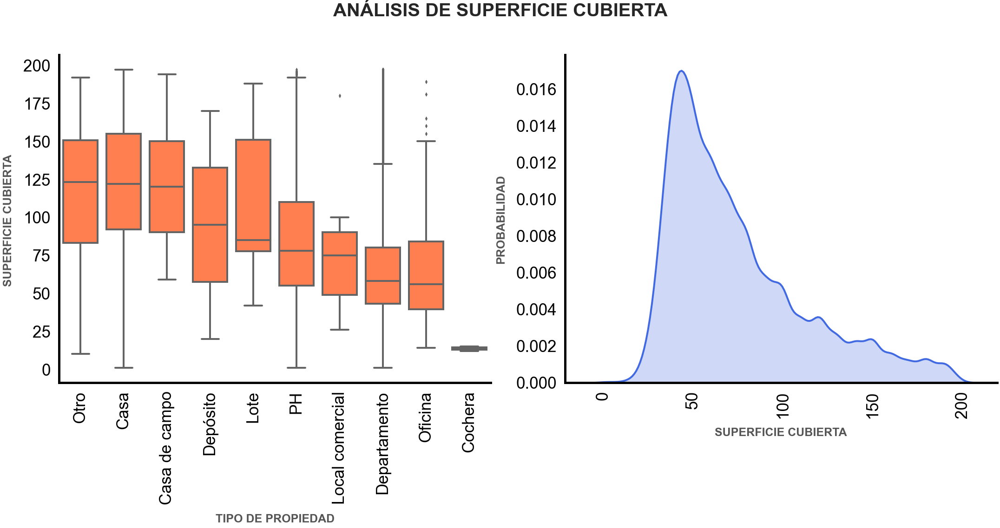

In [35]:
data = quitar_outliers('Superficie cubierta', pre_chkpoint)
graficar_comparacion(data, 'Superficie cubierta', True)

Respecto a los gráficos anteriores podemos destacar como las categorías *otro*, *casa* y *casa de campo* tienen una mediana similar superior al resto, la primera de ellas posee un sesgo negativo *—mayor dispersión entre el primer quartil y la mediana—*. La categoría *lote* también posee sesgo, en este caso es positivo *—mayor dispersión de datos entre la mediana y el tercer cuartil—*.

En nuestro gráfico de densidad podemos observar como observar como nuestros datos se agrupan en un rango que abarca desde los 40 mts<sup>2</sup> hasta los casi 100 mts<sup>2</sup>.

#### PRECIO

Por último, repetimos el proceso para el precio. Analizamos la distribución del precio para verificar dónde debemos establecer las cotas.

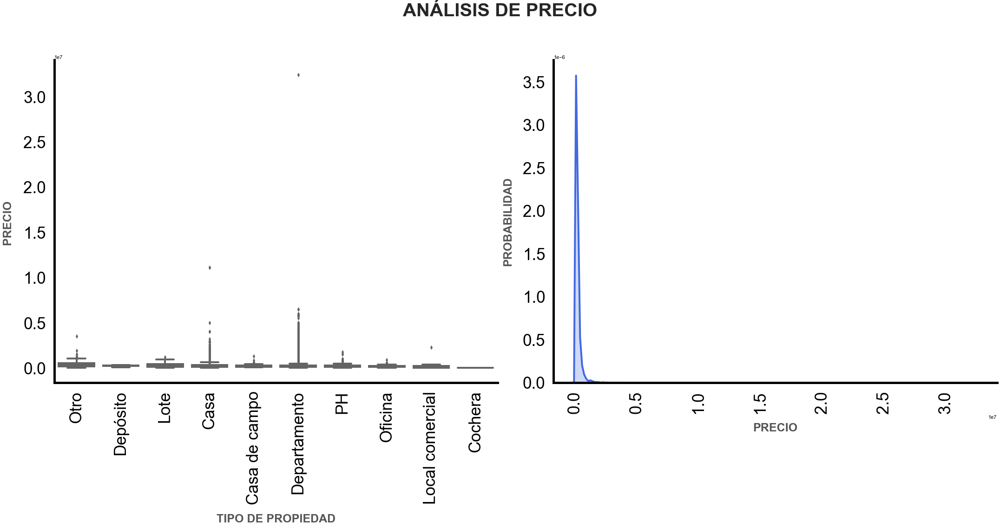

In [36]:
graficar_comparacion(pre_chkpoint, 'Precio', True)

Teniendo en cuenta los diagramas desplegados previamente sobre el atributo **PRECIO**, realizamos un filtrado de outliers utilizando la técnica de *rango intercuartílico*, de este modo, eliminamos el ruido que se presentan en este atributo.

PRECIO: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 8144



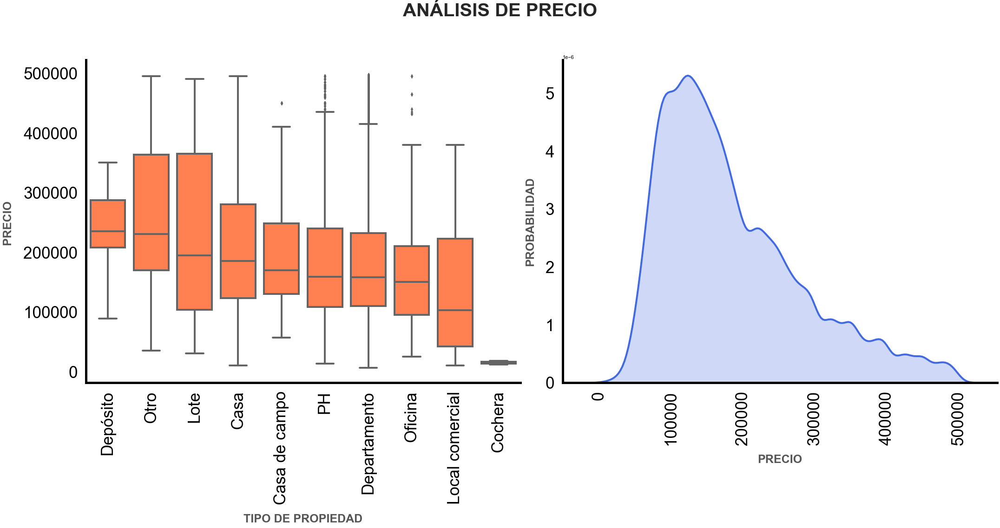

In [37]:
data = quitar_outliers('Precio', pre_chkpoint)
graficar_comparacion(data, 'Precio', True)

Nuestro gráfico de densidad nos sitúa la mayor cantidad de datos en un rango que va desde los USD\\$100.000 hasta los USD\\$250.000, en nuestro gráfico de cajas podemos visualizar esto al observar las distintas cajas *—con las medianas se visualiza de mejor forma—* de cada categoría. Si bien, las categorías *depósito*, *otro*, *lote* y *casa* superan este rango, en el gráfico de densidad podemos apreciarlo en la cola de la derecha *—valores superiores a los USD\\$300.000—* con la presencia de picos locales,.

La categoría *lote* es la que presenta una mayor distribución a las demás categorías.

## FILTRADO DEL DATASET: CHECKPOINT

A partir de los resultados anteriores, se seleccionan las tres clases más abundantes de tipos de propiedad y la zona con más propiedades publicadas. Creamos un nuevo dataset con aquellas instancias que cumplen con esas condiciones e imprimimos su shape.

In [38]:
chkpoint = properati.copy()
zonas_out = [ 'Bs.As. G.B.A. Zona Norte', 'Bs.As. G.B.A. Zona Sur', 'Bs.As. G.B.A. Zona Oeste' ]
propiedades_out = [ 'Casa de campo', 'Cochera', 'Depósito', 'Local comercial', 'Lote', 'Oficina', 'Otro' ]
chkpoint.query('Zona == "Capital Federal"', inplace=True)
chkpoint['Zona'].cat.remove_categories(removals=zonas_out, inplace=True)
chkpoint.query('`Tipo de propiedad` == "Casa" | `Tipo de propiedad` == "Departamento" | `Tipo de propiedad` == "PH"',
              inplace=True)
chkpoint['Tipo de propiedad'].cat.remove_categories(removals=propiedades_out, inplace=True)
print('Total de registros:', chkpoint.shape[0])
print('Total de columnas:', chkpoint.shape[1])

Total de registros: 91485
Total de columnas: 19


Creamos una columna en la que podamos reflejar el precio por mt<sup>2</sup> y, a su vez, eliminamos las que no se van a utilizar.

In [39]:
chkpoint.drop(columns=[ 'Creación', 'Latitud', 'Longitud', 'Descripción', 'Fecha inicio', 'Fecha fin', 'Moneda',
                        'País', 'Tipo de operación', 'Título', 'Zona' ], inplace=True)
chkpoint['Precio/mt2'] = round(chkpoint['Precio']/chkpoint['Superficie total'], 2)
chkpoint.sample(5)

,Barrio,Ambientes,Habitaciones,Baños,Superficie total,Superficie cubierta,Precio,Tipo de propiedad,Precio/mt2
78597,Recoleta,4,3,2.0,180.0,177.0,465000.0,Departamento,2583.33
42956,Velez Sarsfield,3,2,1.0,95.0,74.0,155000.0,PH,1631.58
62995,Belgrano,5,4,4.0,240.0,NaN,825000.0,Departamento,3437.50
33029,Palermo,4,3,2.0,71.0,62.0,195000.0,Departamento,2746.48
87595,Belgrano,2,1,1.0,34.0,34.0,110000.0,Departamento,3235.29


### RANGO INTERCUARTÍLICO

Aplicamos la eliminación de outliers como parte de la correciones para poder evaluar los datos.

In [40]:
chkpoint = quitar_outliers('Ambientes', chkpoint)
chkpoint = quitar_outliers('Habitaciones', chkpoint)
chkpoint = quitar_outliers('Baños', chkpoint)
chkpoint = quitar_outliers('Superficie total', chkpoint)
chkpoint = quitar_outliers('Superficie cubierta', chkpoint)
chkpoint = quitar_outliers('Precio', chkpoint)

AMBIENTES: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 1314

HABITACIONES: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 215

BAÑOS: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 2637

SUPERFICIE TOTAL: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 3736

SUPERFICIE CUBIERTA: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
Cant. superior a Q3: 3133

PRECIO: Detección y eliminación de outliers (IQR)
-----------------------------------------------------------------
Cant. inferior a Q1: 0
C

Analizamos el dataset después de haber aplicado el depurado de outliers. 23769 registros fueron detectados con outliers, son un 25% de los datos.

In [41]:
print('Total de registros: ', chkpoint.shape[0])

Total de registros:  67716


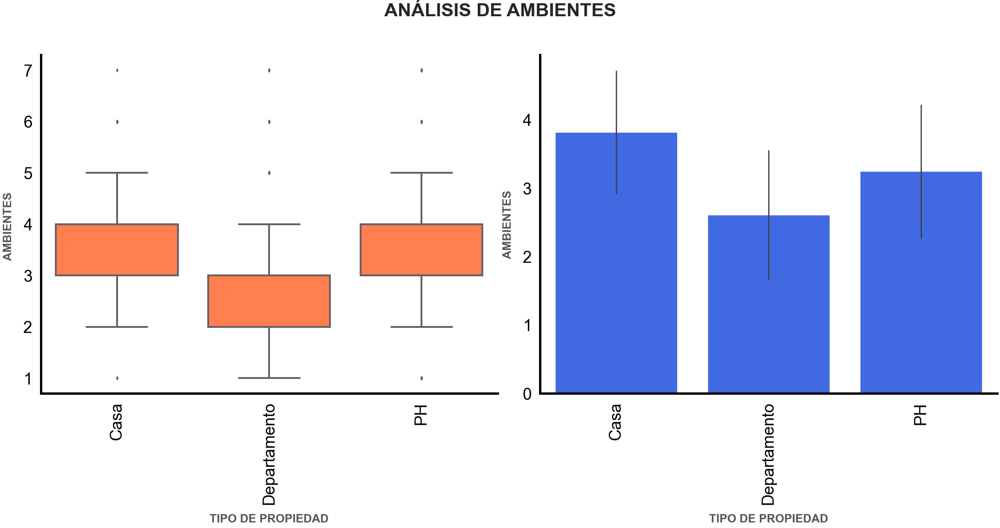

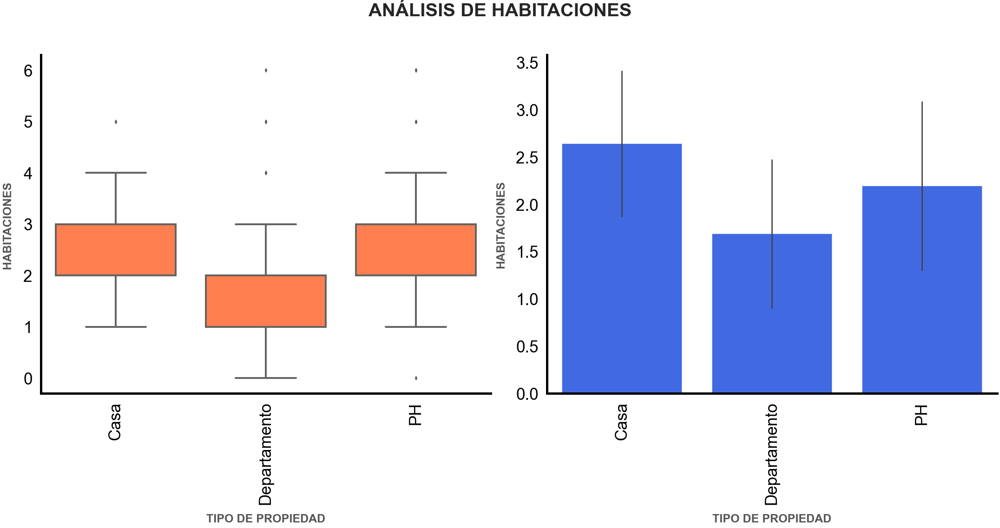

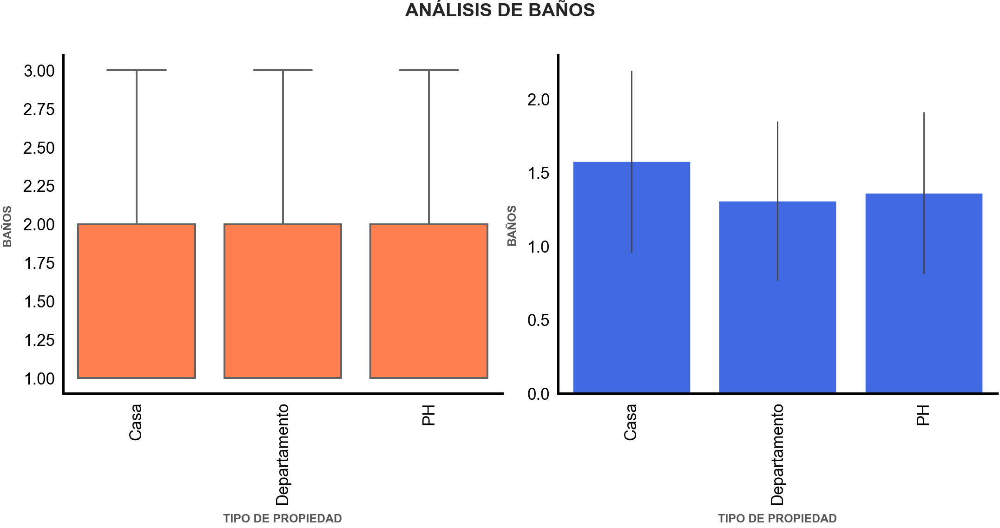

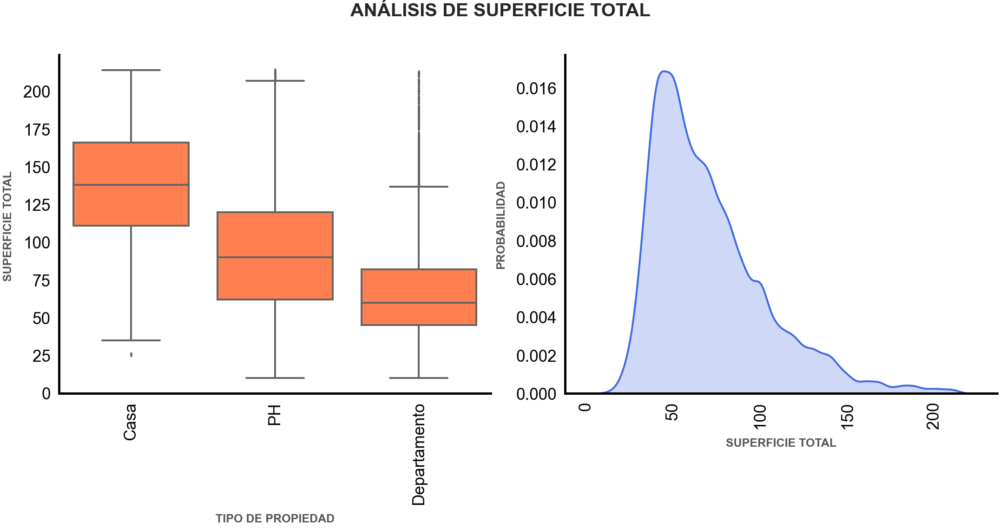

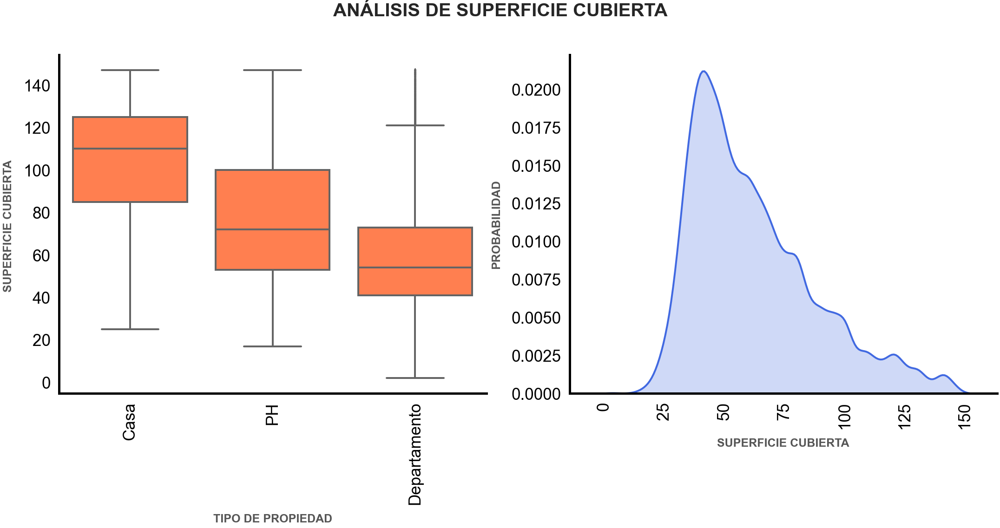

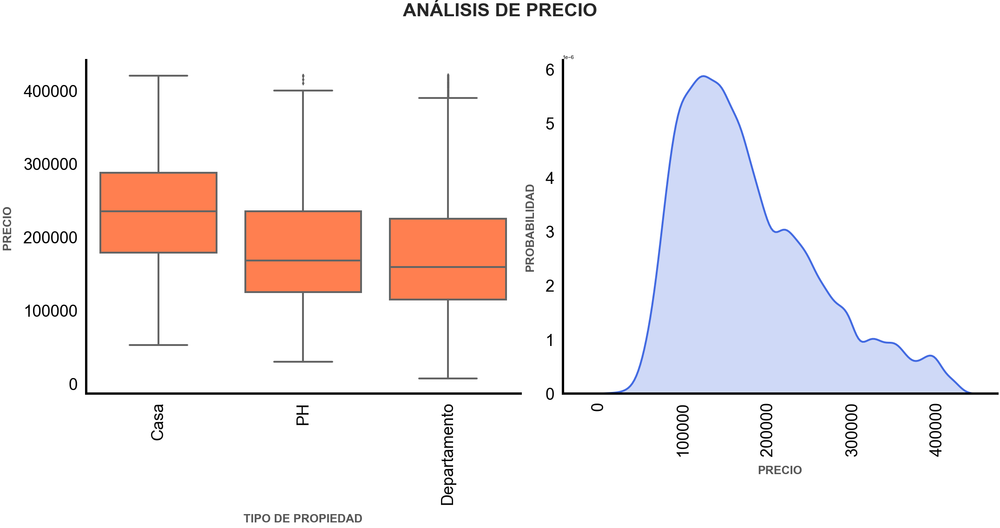

In [42]:
graficar_comparacion(chkpoint, 'Ambientes')
graficar_comparacion(chkpoint, 'Habitaciones')
graficar_comparacion(chkpoint, 'Baños')
graficar_comparacion(chkpoint, 'Superficie total', True)
graficar_comparacion(chkpoint, 'Superficie cubierta', True)
graficar_comparacion(chkpoint, 'Precio', True)

Habiendo realizado la depuración de outliers correspondiente y quedandonos con los registros del atributo *tipo de propiedad* que predominan *—casa, departamento, ph—* de la zona *Capital federal*, nos encontramos con lo siguiente:

* Los gráficos respecto al atributo baño nos dice que el 50% de los registros, ya sean de la categoría *casa*, *departamento* o *ph*, se encuentran en el rango de un baño o dos.

* Los gráficos que corresponden al atributo ambientes y habitaciones nos advierten de correlación, lo mismo sucede en los gráficos correspondientes a los atributos superficie total y superficie cubierta. De estos últimos gráficos podemos ver como la mediana de la categoría *casa* es la mayor y la que corresponde a *departamento* es la menor, entendiendo que los registros con mayor superficie poseen, a su vez, mayor cantidad de ambientes y habitaciones.

* De los gráficos en relación al atributo precio, visualizamos como la mediana de la categoría *casa* es mayor a las demás, lo que se condice con lo analizado previamente; si entendemos que el precio tiene estrecha relación a la superficie total, entonces es lógico encontrar que esta categoría tenga una mediana mayor en el atributo precio respecto a las otras dos categorías. Es importante destacar que las medianas de las categorías *ph* y *departamento* son similares siendo que la primera posee una mediana mayor en superficie total al igual que en superficie cubierta.



Analizamos que columnas continuan con valores nulos.

In [43]:
column = ''
for i in chkpoint.columns:
    if chkpoint[i].isna().sum() > 0:
        #isna_count = properati[i].isna().sum()
        cantidad = chkpoint[i].isna().sum()
        total = chkpoint[i].count()
        porcentaje = round(100*cantidad/total, 2)
        column += f'\t{ i } tiene { chkpoint[i].isna().sum() } datos nulos ({ porcentaje }%).\n'
    else:
        column = 'No hay columnas con valores nulos.'
print('Las siguientes columnas tienen valores nulos:\n', column)

Las siguientes columnas tienen valores nulos:
 No hay columnas con valores nulos.


Utilizamos el método ``describe()`` para visualizar que correctamente estén aplicados los filtros.

In [44]:
chkpoint.iloc[:, 1:9].describe()

,Ambientes,Habitaciones,Baños,Superficie total,Superficie cubierta,Precio,Precio/mt2
count,67716.000000,67716.000000,67716.000000,67716.000000,67716.000000,67716.000000,67716.000000
mean,2.688877,1.754017,1.316557,70.762789,62.009732,177992.865955,2623.675227
std,0.974407,0.818017,0.540227,32.798070,25.853359,80691.817978,803.814145
min,1.000000,0.000000,1.000000,10.000000,2.000000,7500.000000,180.000000
25%,2.000000,1.000000,1.000000,46.000000,42.000000,115000.000000,2112.240000
50%,3.000000,2.000000,1.000000,63.000000,56.000000,160000.000000,2547.170000
75%,3.000000,2.000000,2.000000,87.000000,77.000000,227000.000000,3046.150000
max,7.000000,6.000000,3.000000,214.000000,147.000000,421000.000000,22916.670000


### CORRELACIONES

Visualizamos las correlaciones entre las variables con el método ``corr()``.

In [45]:
chkpoint.iloc[:, 1:9].corr()

,Ambientes,Habitaciones,Baños,Superficie total,Superficie cubierta,Precio,Precio/mt2
Ambientes,1.000000,0.934195,0.496511,0.731242,0.801398,0.573701,-0.216043
Habitaciones,0.934195,1.000000,0.500293,0.716347,0.791980,0.554770,-0.215332
Baños,0.496511,0.500293,1.000000,0.542020,0.590402,0.583527,0.037459
Superficie total,0.731242,0.716347,0.542020,1.000000,0.897039,0.706978,-0.290774
Superficie cubierta,0.801398,0.791980,0.590402,0.897039,1.000000,0.738144,-0.187432
Precio,0.573701,0.554770,0.583527,0.706978,0.738144,1.000000,0.390189
Precio/mt2,-0.216043,-0.215332,0.037459,-0.290774,-0.187432,0.390189,1.000000


Realizamos un gráfico de heatmap para visualizar las correlaciones entre las variables.

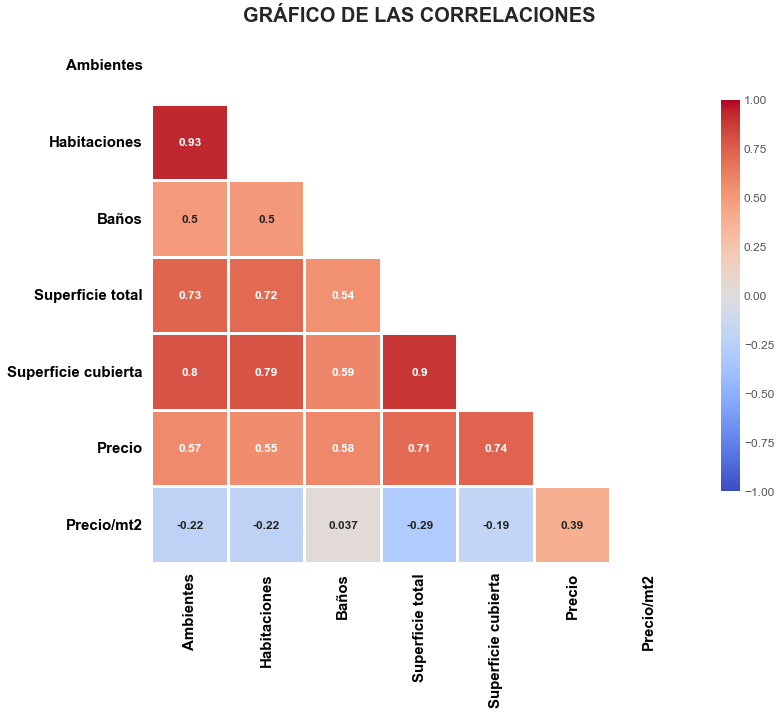

In [46]:
correlaciones = chkpoint.iloc[:,1:9].corr()
mask = np.zeros(correlaciones.shape, dtype=bool)
mask[np.triu_indices(len(mask))] = True

plt.figure(figsize=(12,12))
ax = sns.heatmap(correlaciones, annot=True, annot_kws= { 'fontsize': '12', 'fontweight': 'bold' },
                 cbar_kws={ 'shrink' : .6 }, cmap='coolwarm', linewidths=2, mask=mask, square=True,
                 vmax= 1, vmin= -1)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=12, length=0)
plt.tick_params(direction='out', colors='black', length=6, pad=3, width=2)
plt.title('GRÁFICO DE LAS CORRELACIONES', fontsize=20, horizontalalignment='center', weight='bold')
plt.xticks(fontsize=15, horizontalalignment='center', rotation=90, weight='bold')
plt.yticks(fontsize=15, verticalalignment='center', rotation=0, weight='bold')
plt.show()

### PAIRPLOT

Desplegamos un pairplot.

In [47]:
rc_params = { 'axes.edgecolor': 'black', 'axes.facecolor': 'white', 'axes.labelsize': 20, 'axes.labelpad': 15,
              'axes.labelweight': 'bold', 'axes.linewidth': 4, 'legend.fancybox': True, 'legend.fontsize': 30,
              'legend.frameon': True, 'legend.shadow': True, 'legend.title_fontsize': 35, 'xtick.labelsize': 25,
              'ytick.labelsize': 25, 'xtick.major.size': 10, 'ytick.major.size': 10,
              'xtick.major.width': 4, 'ytick.major.width': 4 }

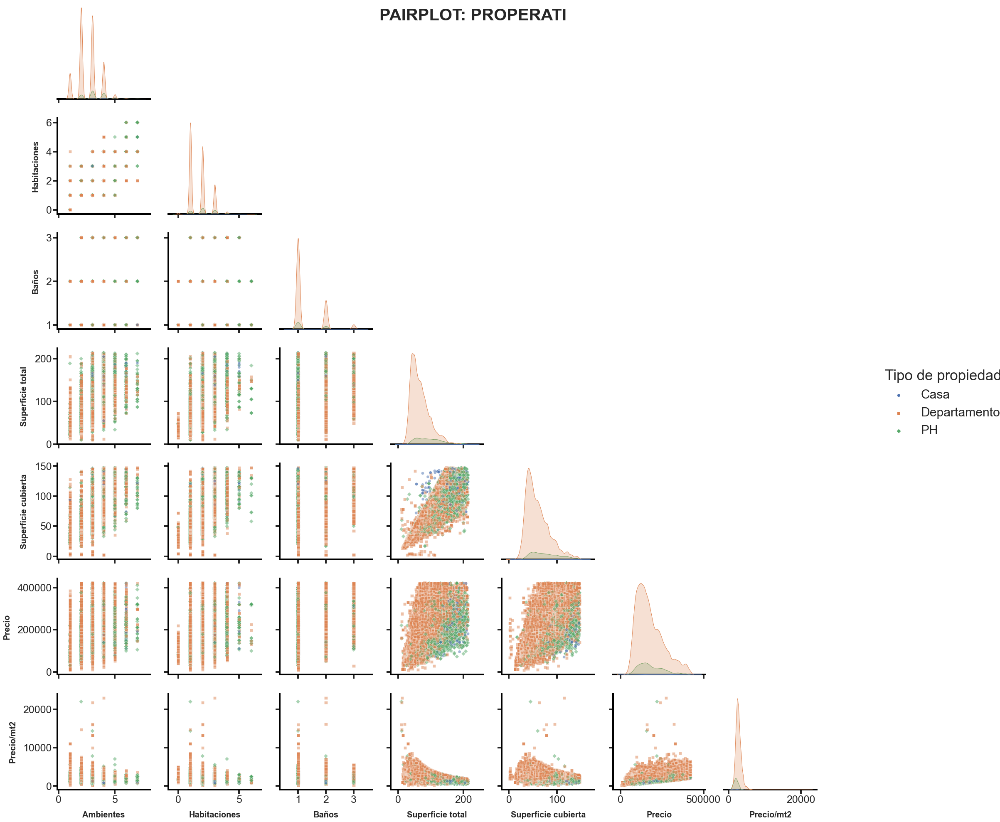

In [48]:
sns.set(style='ticks', rc=rc_params)
#sns.set_context(style='ticks', rc=rc_params)
pairplot = sns.pairplot(data=chkpoint.iloc[:, 1:9], height=4, hue='Tipo de propiedad', corner=True,
                        markers=['o', 's', 'D'], plot_kws={ 'alpha': 0.5, 's': 50 })
fig = pairplot.fig
fig.subplots_adjust(hspace=0.2, wspace=0.2)
fig.suptitle('PAIRPLOT: PROPERATI', fontsize=40, fontweight='bold')
pairplot.fig.get_children()[-1].set_bbox_to_anchor((1.05, 0.5, 0, 0))

## ANÁLISIS PERSONAL

### DISTRIBUCIÓN DE PRECIO/ZONA

Analizamos la distribución del precio respecto a las diferentes zonas. Usamos el dataset sin haber hecho una depuración de outliers pero utilizamos un filtro para no alargar demasiado la cola.

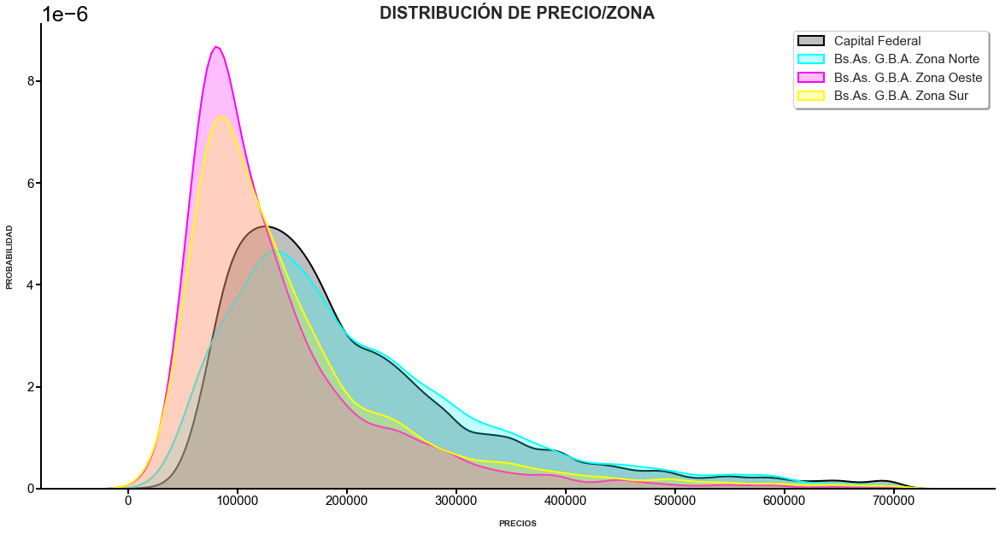

In [49]:
mask = (pre_chkpoint['Precio'] <= 700000) & (pre_chkpoint['Precio'] >= 1000)
zonas = [ 'Capital Federal', 'Bs.As. G.B.A. Zona Norte', 'Bs.As. G.B.A. Zona Oeste', 'Bs.As. G.B.A. Zona Sur' ]
color = [ 'black', 'cyan', 'magenta', 'yellow' ]

configurar_global()
plt.figure(figsize=(20,10))

for idx, zona in enumerate(zonas):
    data = pre_chkpoint[mask].where(pre_chkpoint['Zona'] == zona).dropna()
    sns.kdeplot(data['Precio'], color=color[idx], shade=True, linewidth=2, label=zona)

plt.title('DISTRIBUCIÓN DE PRECIO/ZONA', fontsize=20, weight='bold')
plt.legend(fontsize=15, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.tick_params(direction='out', colors='black', length=6, pad=2, width=2)
plt.xlabel('PRECIOS', fontsize=10, labelpad=15, weight='bold')
plt.xticks(fontsize=15)
plt.ylabel('PROBABILIDAD', fontsize=10, labelpad=15, weight='bold')
plt.yticks(fontsize=15)
plt.show()

En este gráfico de densidad podemos observar como se diferencian las zonas donde priman los precios elevados *—Capital federal y Bs As. G.B.A. Zona norte—* respecto a las zonas donde se manifiestan propiedades con menor costo *—Bs As. G.B.A. Zona sur y Bs As. G.B.A. Zona oeste—*. En las zonas que encontramos las propiedades a un menor precio vemos como decaen los registros pasados los USD\$200.000, cosa que no sucede en las zonas con precios más elevados.

De esta gráfica podemos observar como la zona donde se encuentra la propiedad influye en el precio de la misma.

### ANÁLISIS DEL PRECIO SEGÚN EL BARRIO

Para este análisis nos valemos del atributo que hemos creado previamente, el ```Precio/mt2```. De este modo, hacemos un promedio del valor del precio por metro cuadrado de cada barrio para cada tipo de propiedad.

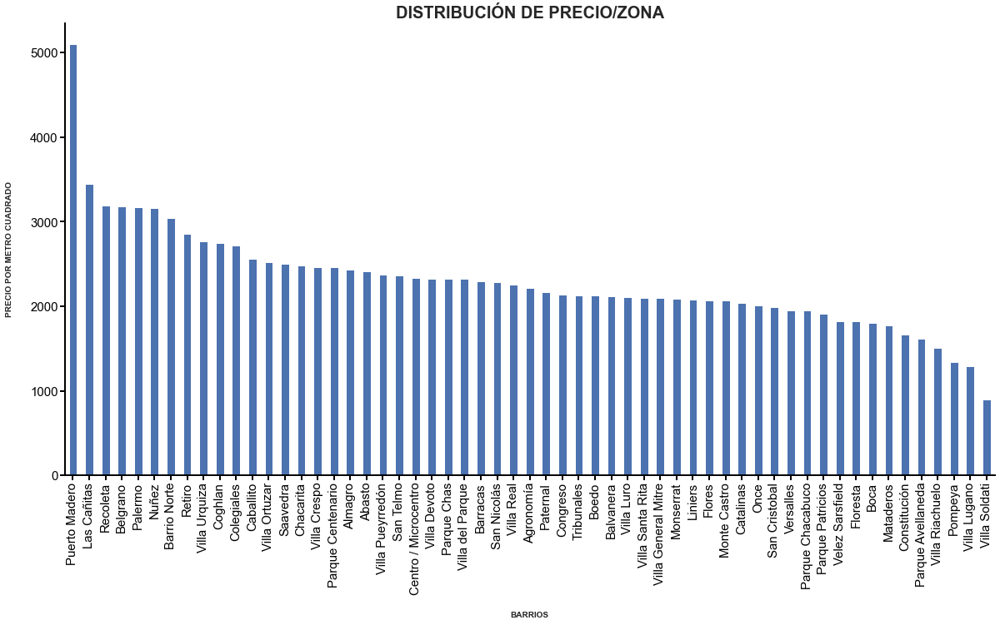

In [50]:
table = pd.pivot_table(chkpoint, index=['Barrio'], values='Precio/mt2', 
                       aggfunc='mean').round(2).sort_values("Precio/mt2", ascending=False)
configurar_global()
fig, ax = plt.subplots(figsize=(20,10))
plt.title('DISTRIBUCIÓN DE PRECIO/ZONA', fontsize=20, weight='bold')
table.plot(ax=ax, legend=False, kind='bar')
plt.tick_params(direction='out', colors='black', length=6, pad=2, width=2)
plt.xlabel('BARRIOS', fontsize=10, labelpad=20, weight='bold')
plt.xticks(fontsize=15, rotation=90)
plt.ylabel('PRECIO POR METRO CUADRADO', fontsize=10, labelpad=20, weight='bold')
plt.yticks(fontsize=15)
plt.show()

En este análisis no tomamos en cuenta las diferentes zonas, solo visualizamos aquellos barrios que pertenecen a *Capital federal*. Anteriormente observamos la influencia que ejercía la zona en el *precio* de la propiedad, aquí podemos observar la injerencia que tiene cada barrio en el precio de las mismas.

Como se observa, *Puerto Madero* es el barrio donde se encuentran las propiedades con mayor valor.

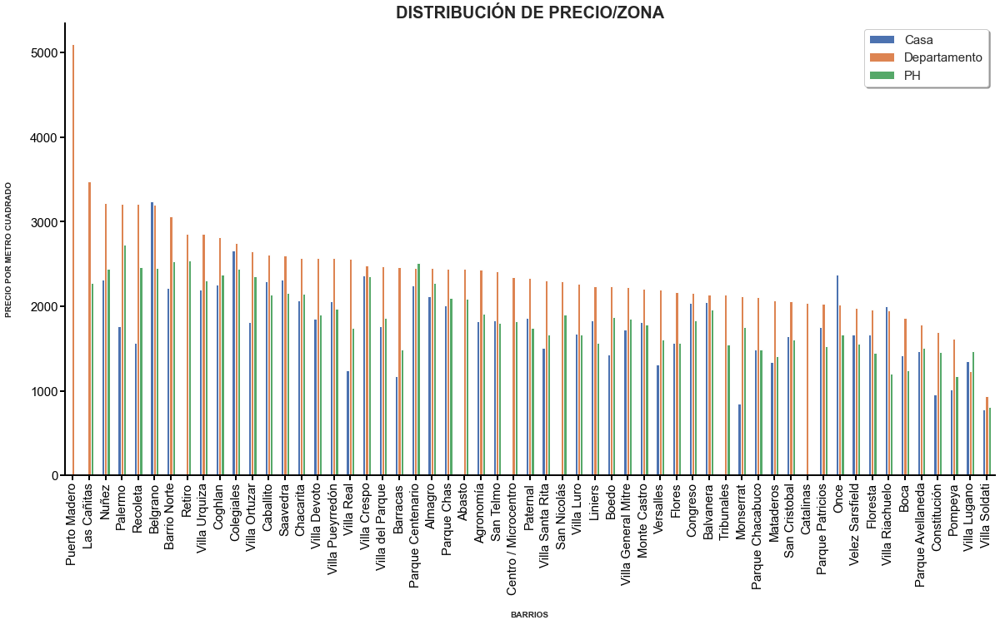

In [51]:
table = pd.pivot_table(chkpoint, columns=['Tipo de propiedad'], index=['Barrio'], values='Precio/mt2',
                       aggfunc='mean').round(2).sort_values('Departamento', ascending=False)
configurar_global()
fig, ax = plt.subplots(figsize=(20,10))
plt.title('DISTRIBUCIÓN DE PRECIO/ZONA', fontsize=20, weight='bold')
table.plot(ax=ax, kind='bar')
plt.legend(fontsize=15, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.tick_params(direction='out', colors='black', length=6, pad=2, width=2)
plt.xlabel('BARRIOS', fontsize=10, labelpad=20, weight='bold')
plt.xticks(fontsize=15, rotation=90)
plt.ylabel('PRECIO POR METRO CUADRADO', fontsize=10, labelpad=20, weight='bold')
plt.yticks(fontsize=15)
plt.show()

Nuevamente corroboramos la importancia del barrio en el precio de las propiedades pero si tomamos en cuenta los diferentes tipos de propiedades *—casa, departamentos, ph—*, nos encontramos que en algunos barrios el precio promedio de las casas superan al de departamentos *—por ejemplo Belgrano—*.

Hay que destacar que el barrio **Puerto Madero** *—al igual que Catalinas—* solo posee registros de departamentos, también encontramos algunos barrios con similar comportamiento *—Retiro, Abasto, San Nicolás, etc.—*, donde no visualizamos registros de casas.

En este caso, ordenamos el precio del metro cuadrado tomando en cuenta el promedio del mismo para los departamentos.

### RELACIÓN ENTRE TIPO DE PROPIEDAD Y ZONAS

Analizamos la relación que existe entre el precio de las diferentes propiedades y la zona donde se encuentra. Nuevamente, nos valemos de nuestros datos estableciendo dos filtros *—la superficie total debe ser mayor a la superficie cubierta y el precio debe situarse entre USD\\$10.000 hasta USD\\$1.000.000—*.

En esta primer aproximación, gráficamos la cantidad de registros que existen en cada zona discriminando el tipo de propiedad. Establecemos un límite en el eje `y` *—a fines visuales—* ya que, como verificamos previamente, departamentos es la categoría que abunda en nuestro tipo de propiedades.

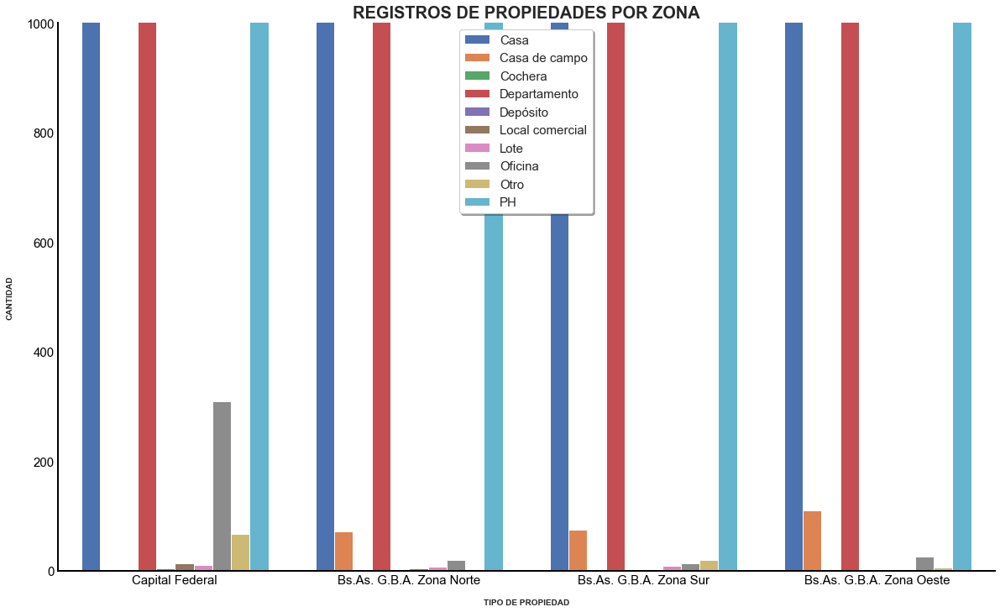

In [64]:
configurar_global()
plt.figure(figsize=(20,12))
sns.countplot(x='Zona', data=pre_chkpoint.query('Precio <= 1000000 & Precio >=10000'),
              hue='Tipo de propiedad', order=pre_chkpoint['Zona'].value_counts(ascending=False).index,
              saturation=1)
plt.tick_params(direction='out', colors='black', length=0, pad=4)
plt.title('REGISTROS DE PROPIEDADES POR ZONA', fontsize=20, weight='bold')
plt.legend(fontsize=15, framealpha=1, frameon=True, loc='upper center')
plt.xlabel('CANTIDAD', fontsize=10, labelpad=15, weight='bold')
plt.xlabel('TIPO DE PROPIEDAD', fontsize=10, labelpad=15, weight='bold')
plt.xticks(fontsize=15)
plt.ylabel('CANTIDAD', fontsize=10, labelpad=15, weight='bold')
plt.ylim(0, 1000)
plt.yticks(fontsize=15)
plt.show()

Nuevamente, corroboramos que la abundancia de registros *departamento*, *casa* y *ph* es notoría en las distintas zonas.

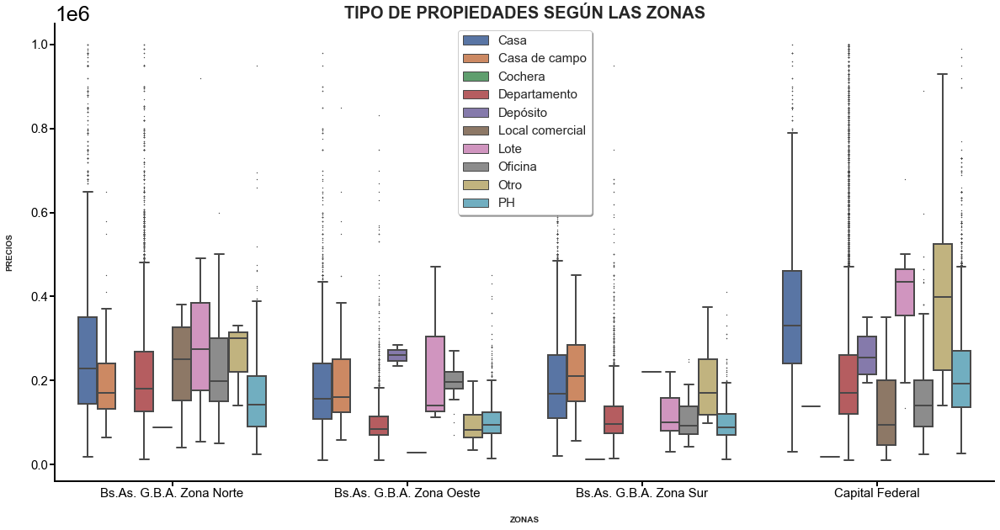

In [63]:
mask = (pre_chkpoint['Precio'] <= 1000000) & (pre_chkpoint['Precio'] >= 10000)

configurar_global()
plt.figure(figsize=(20,10))
sns.boxplot(x='Zona', y='Precio', hue='Tipo de propiedad', data=pre_chkpoint[mask],
            fliersize=.5, linewidth=2)
plt.title('TIPO DE PROPIEDADES SEGÚN LAS ZONAS', fontsize=20, weight='bold')
plt.legend(fontsize=15, framealpha=1, frameon=True, loc='upper center')
plt.tick_params(direction='out', colors='black', length=6, pad=2, width=2)
plt.xlabel('ZONAS', fontsize=10, labelpad=20, weight='bold')
plt.xticks(fontsize=15)
plt.ylabel('PRECIOS', fontsize=10, labelpad=20, weight='bold')
plt.yticks(fontsize=15)
plt.show()

En este gráfico, comparamos los tipos de propiedades tomando en cuenta las distintas zonas. *Capital federal* tiene una mediana mayor en el precio de la categoría *casa* respecto al resto de las zonas, ocurre algo similar con *departamento* y *ph* aunque no está tan marcado. La categoría *lote*, en dicha zona, tiene una mediana mayor que *casa*, también, se destaca que las categorías *local comercial* y *oficina—* posean la menor mediana en dicha zona.

Si comparamos estos datos con otra zona, por ejemplo, *Bs. As. G.B.A. Zona Norte*, podemos visualizar que las medianas en las categorías *local comercial* y *oficina*, son mayores a la que registramos en zona de *Capital federal*.

Respecto a las otras zonas, tomando en cuenta las categorías *casa*, *departamento* y *ph*, reflejamos lo que estuvimos analizando previamente, son zonas con precios más accesibles. Esto también se ve reflejado en las categorías restantes.

De aquí podemos inferir como se concentra en *Capital federal* las facilidades para establecer un local u oficina, es el lugar al que se va a trabajar y es dificil acceder a una casa o terreno para construir una vivienda *—notar ausencia de la categoría casa de campo y la mediana de lote—*.
Caso opuesto sucede en *Bs. As. G.B.A. Zona Norte*, donde los precios para acceder a una casa o un terreno pueden ser menores que para realizar una actividad económica.

Se detaca la ausencia de ciertas categorías en algunas zonas.

### RELACIÓN ENTRE LA SUPERFICIE TOTAL Y EL PRECIO

Verificamos la correlación que existe entre la superficie total y el precio.

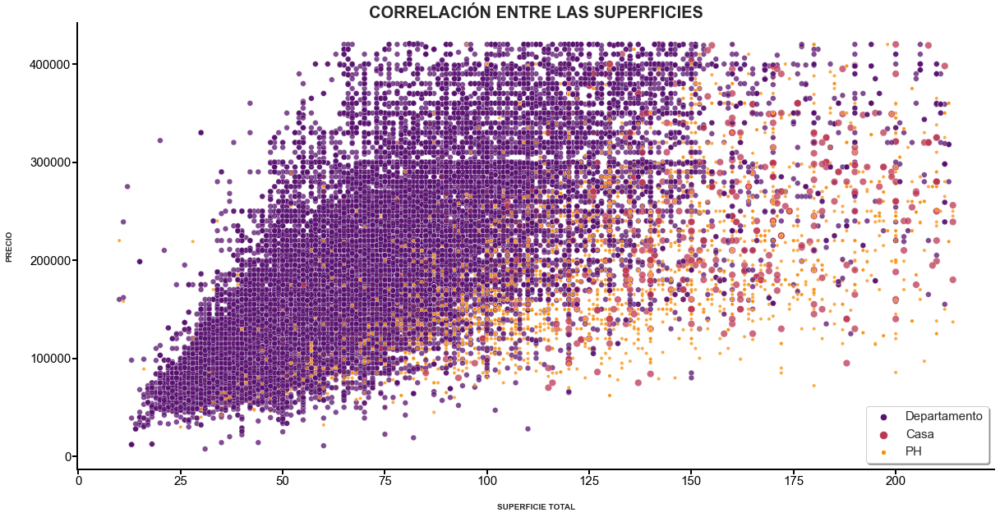

In [65]:
configurar_global()
plt.figure(figsize=(20,10))
sns.scatterplot(x='Superficie total', y='Precio', data=chkpoint, alpha=0.75, hue='Tipo de propiedad',
                hue_order=['Departamento', 'Casa', 'PH'], palette='inferno',
                size='Tipo de propiedad')
plt.title('CORRELACIÓN ENTRE LAS SUPERFICIES', fontsize=20, weight='bold')
plt.legend(fontsize=15, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.tick_params(direction='out', colors='black', length=6, pad=2, width=2)
plt.xlabel('SUPERFICIE TOTAL', fontsize=10, labelpad=20)
plt.xticks(fontsize=15)
plt.ylabel('PRECIO', fontsize=10, labelpad=20)
plt.yticks(fontsize=15)
plt.show()

En nuestro gráfico de dispersión anterior podemos corroborar la correlación  positiva que existe entre la *Superficie total* y el *Precio*.

### DISTRIBUCIÓN DE SUPERFICIE

Analizamos la distribución de la superficie para cada tipo de propiedad.

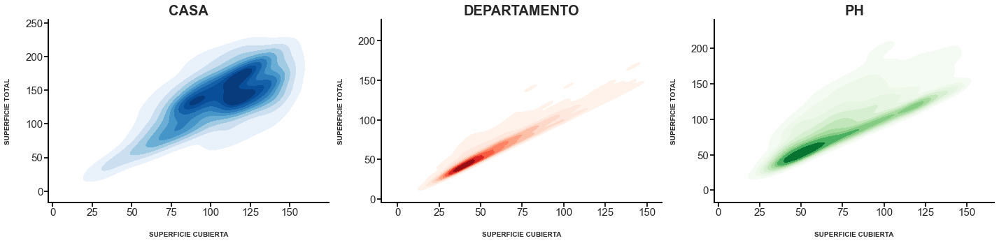

In [66]:
propiedades = [ 'Casa', 'Departamento', 'PH']
colors = [ 'Blues', 'Reds', 'Greens']

fig, ax = plt.subplots(1,3, figsize=(20,5), tight_layout=True)
for idx, tipo in enumerate(propiedades):
    data = chkpoint.where(chkpoint['Tipo de propiedad'] == tipo).dropna()    
    sns.kdeplot(x='Superficie cubierta', y='Superficie total', data=data, cmap=colors[idx], shade=True,
                thresh=0.05, ax=ax[idx])
    ax[idx].set_title(f'{ tipo.upper() }', fontsize=20, fontweight='bold')
    ax[idx].set_xlabel('SUPERFICIE CUBIERTA', fontsize=10, labelpad=20)
    ax[idx].set_ylabel('SUPERFICIE TOTAL', fontsize=10, labelpad=20)
    ax[idx].tick_params(axis='both', labelsize=15, length=6, pad=2, width=2)

En este gráfico comparativo podemos visualizar la distribución de la *superficie total* y *superficie cubierta* para las categorías que más abundan. Como podemos apreciar, las *casas* son las que mayor superficie ocupan y *departamentos* son las de menor superficie.

Otra cosa a destacar, en dicha categoría *—ocurre algo menos pronuciado con los phs—*, se puede apreciar una linealidad entre la superficie cubierta y superficie total. Esto se explica porque, difícilmente, en un departamento exista diferencias entre la superficie cubierta y la superficie total debido a la ausencias de terreno descubierto. En las casas no sucede esto debido a patios, por ejemplo.

## MACHINE LEARNING

In [67]:
import sklearn
from sklearn.model_selection import train_test_split
# Machine learning
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

Entrenar un modelo de vecinos más cercanos y un modelo de árbol de decisión con hiperparámetros iniciales de su elección.

Evaluar los modelos obtenidos. Para ello, evalúa la métrica elegida en el conjunto de Test y en el conjunto de Train. También, realiza gráficos de valores reales vs. valores predichos.

Mejorar el desempeño de sus modelos optimizando el número de vecinos y la profundidad del árbol, respectivamente.
Entre los modelos entrenados, ¿cuál elegirías para utilizar? ¿Por qué?

Ser crítico/a con la metodología utilizada. Por ejemplo, responde las siguientes preguntas: ¿Qué información no estás usando que podría ayudar al modelo? ¿Qué información puede estar demás o repetida?

Estos lineamientos corresponden al mínimo entregable de esta sección.

### FILTRADO

Importante: para asegurarnos que trabajes con un dataset apropiados, debes volver a cargar los datos y realizar el siguiente filtrado:

* Selecciona aquellas propiedades en Capital Federal y cuyo tipo de propiedad es Departamento, PH o Casa.
* Selecciona aquellas propiedades cuya superficie total es menor a 1000 m<sup>2</sup> y mayor a 15 m<sup>2</sup>.
* Selecciona aquellas propiedades cuya precio es menor $4.000.000 dólares.
* Selecciona las columnas rooms, bedrooms, bathrooms, surface_total, surface_covered y price.
* Descarta aquellas instacias con valores faltantes.
* Checkpoint: deberías obtener un dataset con 81.021 instacias y 6 columnas.

In [68]:
ml_data = properati.copy()
columns_out = [ 'Barrio', 'Creación', 'Descripción', 'Fecha inicio', 'Fecha fin', 'Latitud', 'Longitud', 'Moneda',
                'País', 'Tipo de operación', 'Tipo de propiedad', 'Título', 'Zona' ]

In [69]:
ml_data.query('Zona == "Capital Federal"', inplace=True)
ml_data['Zona'].cat.remove_categories(removals=zonas_out, inplace=True)
ml_data.query('`Tipo de propiedad` == "Casa" | `Tipo de propiedad` == "Departamento" | `Tipo de propiedad` == "PH"',
              inplace=True)
ml_data['Tipo de propiedad'].cat.remove_categories(removals=propiedades_out, inplace=True)
ml_data.drop(columns=columns_out, inplace=True)

In [70]:
ml_data.query('`Superficie total` <= 1000 & `Superficie total` >= 15', inplace=True)
ml_data.query('Precio <= 4000000', inplace=True)
ml_data.dropna(inplace=True)
ml_data.shape

(81019, 6)

In [71]:
X, y = ml_data[['Ambientes', 'Baños', 'Habitaciones', 'Superficie total', 'Superficie cubierta']], ml_data['Precio']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

La métrica que vamos a utilizar para evaluar los modelos es el *coeficiente de determinación*. La elección de cambiar la métrica en pos de **R<sup>2</sup>** radica en la necesidad de explicar la calidad de los distintos modelos y no que tan preciso es; **RMSE** no clarifica tan acertadamente dicho cometido pero sí  la precisión de nuestro modelo, por dicho motivo se eligió incluirla en el análisis.

De todos modos, también se desplegan los resultados de dos métricas adicionales: *error medio absoluto* y *raíz del error cuadrátio medio*.

### BENCHMARK

Entrenamos un benchmark utilizando un modelo `LinearRegression`.

TRAIN:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 199173.83
ERROR ABSOLUTO MEDIO: 96179.99
COEFICIENTE DE DETERMINACIÓN: 0.55

TEST:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 202449.37
ERROR ABSOLUTO MEDIO: 97191.47
COEFICIENTE DE DETERMINACIÓN: 0.55


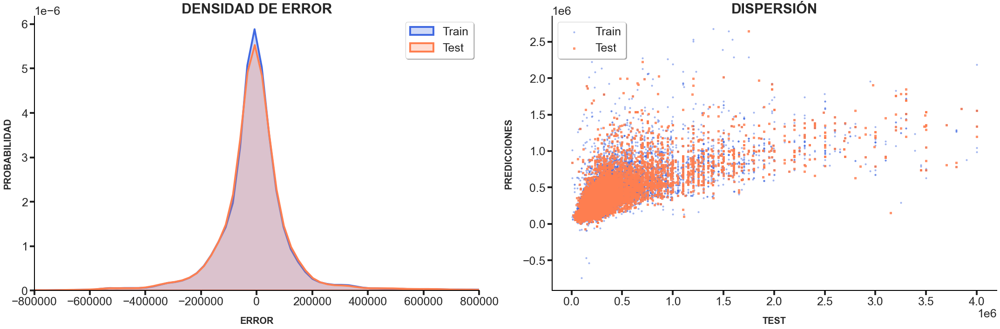

In [72]:
benchmark = LinearRegression(n_jobs=-1)
benchmark.fit(X_train, y_train)

y_predicciones_train = benchmark.predict(X_train)
print('TRAIN:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_train, y_predicciones_train, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_train, y_predicciones_train).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_train, y_predicciones_train).round(2) }')

y_predicciones = benchmark.predict(X_test)
print('\nTEST:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_test, y_predicciones, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_test, y_predicciones).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_test, y_predicciones).round(2) }')

configurar_global()
plt.figure(figsize=(30,10), tight_layout=True)
plt.subplot(1,2,1)
sns.kdeplot(y_train - y_predicciones_train, color='royalblue', fill=True, linewidth=4, label='Train')
sns.kdeplot(y_test - y_predicciones, color='coral', fill=True, linewidth=4, label='Test')
plt.title('DENSIDAD DE ERROR', fontsize=30, weight='bold')
plt.xlabel('ERROR', fontsize=20, labelpad=20, ha='center', weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PROBABILIDAD', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlim(-800000, 800000)

plt.subplot(1,2,2)
plt.scatter(y_train, y_predicciones_train, alpha=.4, color='royalblue', label='Train', marker='o', s=10)
plt.scatter(y_test, y_predicciones, alpha=.8, color='coral', label='Test', marker='s', s=15)
plt.title('DISPERSIÓN', fontsize=30, weight='bold')
plt.xlabel('TEST', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PREDICCIONES', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper left', shadow=True)
plt.show()

### DecisionTreeRegressor

Entrenamos un modelo `DecisionTreeRegressor` para poder ajustar los parametros y realizar una comparación con nuestro benchmark.

#### CURVA DE VALIDACIÓN Y CURVA DE APRENDIZAJE

Realizamos la curva de validación y la curva de aprendizaje para poder evaluar los hiperparámetros que mejor se ajusten a nuestro modelo predictorio.

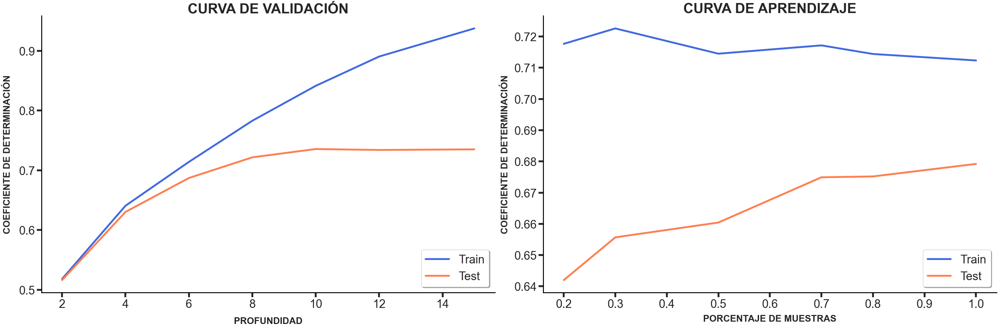

In [73]:
depths = [2, 4, 6, 8, 10, 12, 15]
sizes = [0.2, 0.3, 0.5, 0.7, 0.8, 1]
plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
train_scores, validation_scores = validation_curve(estimator=DecisionTreeRegressor(criterion='friedman_mse', random_state=5),
                                             X=X_train, y=y_train, n_jobs=-1, param_name='max_depth',
                                             param_range=depths, scoring='r2')
plt.subplot(1,2,1)
plt.plot(depths, pd.Series(train_scores.mean(axis=1), index=depths), color='royalblue', label='Train', linewidth=4)
plt.plot(depths, pd.Series(validation_scores.mean(axis=1), index=depths), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE VALIDACIÓN', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.xlabel('PROFUNDIDAD', fontsize=20, labelpad=15, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=15, weight='bold')
plt.yticks(fontsize=25)

_, train_scores, validation_scores = learning_curve(estimator=DecisionTreeRegressor(criterion='friedman_mse',
                                                                                    max_depth=6, random_state=5),
                                                    X=X, y=y, n_jobs=-1, random_state=5, scoring='r2', shuffle=True,
                                                    train_sizes=sizes)
plt.subplot(1,2,2)
plt.plot(sizes, pd.Series(train_scores.mean(axis=1), index=sizes), color='royalblue', label='Train', linewidth=4)
plt.plot(sizes, pd.Series(validation_scores.mean(axis=1), index=sizes), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE APRENDIZAJE', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.xlabel('PORCENTAJE DE MUESTRAS', fontsize=20, labelpad=10, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=10, weight='bold')
plt.yticks(fontsize=25)
plt.show()

Luego de verificar verificar las graficas correspondientes, la profundidad que mejor se adapta al modelo de regresión es seis, consiguiendo que el *coeficiente de determinación* sea de 0.7, resultado similar tanto en los datos de entrenamiento como de prueba, de este modo, la varianza de error es similar en los dos conjuntos de datos.

#### MODELO VALIDADO

Hacemos las pruebas correspondientes para nuestra profundidad seleccionada.

DecisionTreeRegressor
----------------------------------------
TRAIN:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 159067.54
ERROR ABSOLUTO MEDIO: 75284.3
COEFICIENTE DE DETERMINACIÓN: 0.71

TEST:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 166031.33
ERROR ABSOLUTO MEDIO: 76997.39
COEFICIENTE DE DETERMINACIÓN: 0.7


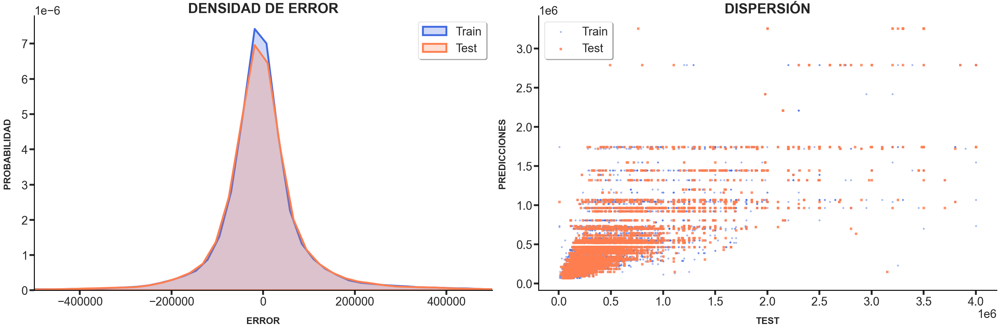

In [74]:
regressor = DecisionTreeRegressor(criterion='friedman_mse', max_depth=6, random_state=5)
regressor.fit(X_train, y_train)

y_predicciones_train = regressor.predict(X_train)
print('DecisionTreeRegressor')
print('----------------------------------------')
print('TRAIN:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_train, y_predicciones_train, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_train, y_predicciones_train).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_train, y_predicciones_train).round(2) }')

y_predicciones = regressor.predict(X_test)
print('\nTEST:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_test, y_predicciones, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_test, y_predicciones).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_test, y_predicciones).round(2) }')

plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
plt.subplot(1,2,1)
sns.kdeplot(y_train - y_predicciones_train, color='royalblue', fill=True, linewidth=4, label='Train')
sns.kdeplot(y_test - y_predicciones, color='coral', fill=True, linewidth=4, label='Test')
plt.title('DENSIDAD DE ERROR', fontsize=30, weight='bold')
plt.xlabel('ERROR', fontsize=20, labelpad=20, ha='center', weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PROBABILIDAD', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlim(-500000, 500000)

plt.subplot(1,2,2)
plt.scatter(y_train, y_predicciones_train, alpha=.4, color='royalblue', label='Train', marker='o', s=10)
plt.scatter(y_test, y_predicciones, alpha=.8, color='coral', label='Test', marker='s', s=15)
plt.title('DISPERSIÓN', fontsize=30, weight='bold')
plt.xlabel('TEST', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PREDICCIONES', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper left', shadow=True)
plt.show()

Comprobamos que el *coeficiente de determinación* es similar en el conjunto de entrenamiento como en el conjunto de prueba. A su vez, verificamos que la *raíz del error cuadrático medio* como el *error absoluto medio* tienen la misma similitud en los conjuntos de datos correspondientes. 

Como se puede apreciar en las gráficas, la distribución de error en los datos de entrenamiento y en los datos de prueba son similares, por lo tanto, confirmamos que el modelo no se encuentra muy especializado a los datos de entrenamiento, por lo cual, generaliza bien a los datos nuevos.

### KNeighborsRegressor

Entrenamos un `KNeighborsRegressor`, ajustamos los parámetros y analizamos los resultados.

#### CURVA DE VALIDACIÓN Y CURVA DE APRENDIZAJE

Realizamos la curva de validación y la curva de aprendizaje para poder evaluar los hiperparámetros que mejor se ajusten a nuestro modelo predictorio.

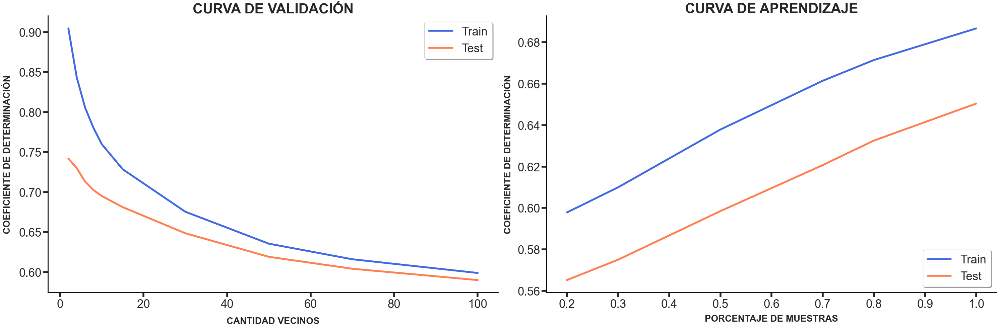

In [75]:
sizes = [0.2, 0.3, 0.5, 0.7, 0.8, 1]
neighbors = [2, 4, 6, 8, 10, 15, 30, 50, 70, 100]

plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
plt.subplot(1,2,1)
train_scores, validation_scores = validation_curve(estimator=KNeighborsRegressor(n_jobs=-1), X=X_train, y=y_train,
                                             n_jobs=-1, param_name='n_neighbors', param_range=neighbors,
                                             scoring='r2')
plt.plot(neighbors, pd.Series(train_scores.mean(axis=1), index=neighbors), color='royalblue', label='Train', linewidth=4)
plt.plot(neighbors, pd.Series(validation_scores.mean(axis=1), index=neighbors), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE VALIDACIÓN', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlabel('CANTIDAD VECINOS', fontsize=20, labelpad=15, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=15, weight='bold')
plt.yticks(fontsize=25)

_, train_scores, validation_scores = learning_curve(estimator=KNeighborsRegressor(n_jobs=-1, n_neighbors=35),
                                                    X=X, y=y, n_jobs=-1, random_state=5, scoring='r2', shuffle=True,
                                                    train_sizes=sizes)
plt.subplot(1,2,2)
plt.plot(sizes, pd.Series(train_scores.mean(axis=1), index=sizes), color='royalblue', label='Train', linewidth=4)
plt.plot(sizes, pd.Series(validation_scores.mean(axis=1), index=sizes), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE APRENDIZAJE', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.xlabel('PORCENTAJE DE MUESTRAS', fontsize=20, labelpad=10, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=10, weight='bold')
plt.yticks(fontsize=25)
plt.show()

Luego de verificar verificar las graficas correspondientes, la cantidad de vecinos que mejor se adapta es cercana a 40.

#### MODELO VALIDADO

Analizamos el modelo con la cantidad de vecinos que analizamos previamente.

TRAIN:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 172678.82
ERROR ABSOLUTO MEDIO: 74040.78
COEFICIENTE DE DETERMINACIÓN: 0.66

TEST:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 179884.14
ERROR ABSOLUTO MEDIO: 76189.43
COEFICIENTE DE DETERMINACIÓN: 0.65


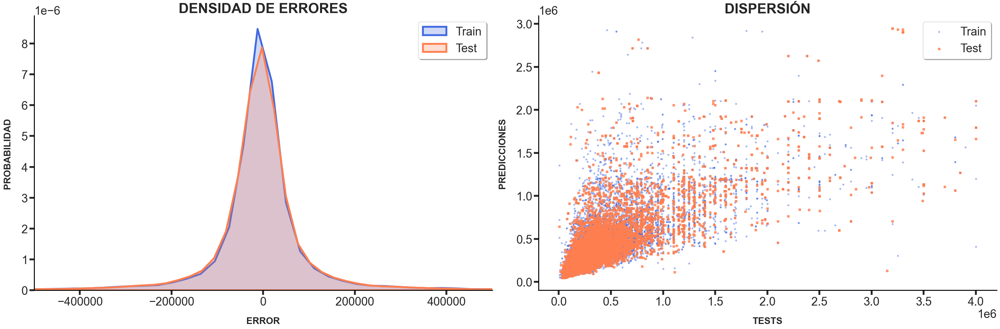

In [76]:
regressor = KNeighborsRegressor(n_neighbors=42, n_jobs=-1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
regressor.fit(X_train, y_train)

y_predicciones_train = regressor.predict(X_train)
print('TRAIN:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_train, y_predicciones_train, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_train, y_predicciones_train).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_train, y_predicciones_train).round(2) }')

y_predicciones = regressor.predict(X_test)
print('\nTEST:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_test, y_predicciones, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_test, y_predicciones).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_test, y_predicciones).round(2) }')

plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
plt.subplot(1,2,1)
sns.kdeplot(y_train - y_predicciones_train, color='royalblue', fill=True, linewidth=4, label='Train')
sns.kdeplot(y_test - y_predicciones, color='coral', fill=True, linewidth=4, label='Test')
plt.title('DENSIDAD DE ERRORES', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlabel('ERROR', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PROBABILIDAD', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.xlim(-500000, 500000)

plt.subplot(1,2,2)
plt.scatter(y_train, y_predicciones_train, alpha=.4, color='royalblue', label='Train', marker='o', s=10)
plt.scatter(y_test, y_predicciones, alpha=.8, color='coral', label='Test', marker='s', s=15)
plt.title('DISPERSIÓN', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlabel('TESTS', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PREDICCIONES', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.show()

Como se puede apreciar, la distribución de error en el entrenamiento y en la prueba son similares.
Cabe destacar que se realizaron pruebas con una ponderación en la distancia (```weights='distance'```) donde el modelo consigue un mejor rendimiento pero la distribución del error entre los conjuntos de datos es muy grande, el modelo queda sobreajustado a los datos de entrenamiento y no consigue generalizar correctamente; por dicho motivo se eligió eliminar dicha ponderación.

### CONCLUSIÓN

Para la problemática planteada yo opto por un modelo de árbol de clasificación ya que los errores en el modelo de vecinos más cercanos, para la métrica elegida, es mayor. A su vez, las otras métricas tienen un mejor desempeño en el árbol de clasificación y la optimización que se logra en dicho modelo es superior, consiguiendo un ajuste acorde a los datos sin llegar a sobreajustarse a los mismos, como a su vez, logrando un correcto aprendizaje de los datos.

Respecto a la crítica metodológica que se llevo a cabo, considero que los datos que no entraron en el análisis son de relevancia considerable, a lo largo del análisis se puede corroborar esto, y ayudarían a conseguir un mejor rendimiento del modelo. Aquí, las variables categóricas tienen un impacto significativo en el ```Precio```, en especial, las distintas ```Zonas``` y los ```Barrios```.

#### COMPLEMENTARIO

En esta sección vamos a analizar los modelos utilizando los datos que se obtienen luego de eliminar los outliers a través de la técnica de *rango intercuartílico*.

In [77]:
iqr = chkpoint.copy()
print(iqr.shape)

X, y = iqr[['Ambientes', 'Baños', 'Habitaciones', 'Superficie total', 'Superficie cubierta']], iqr['Precio']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

(67716, 9)


##### DecisionTreeRegressor

###### CURVA DE VALIDACIÓN Y CURVA DE APRENDIZAJE

Realizamos nuevamente la curva de validación y la curva de aprendizaje para poder evaluar los hiperparámetros que mejor se ajusten a nuestro modelo.

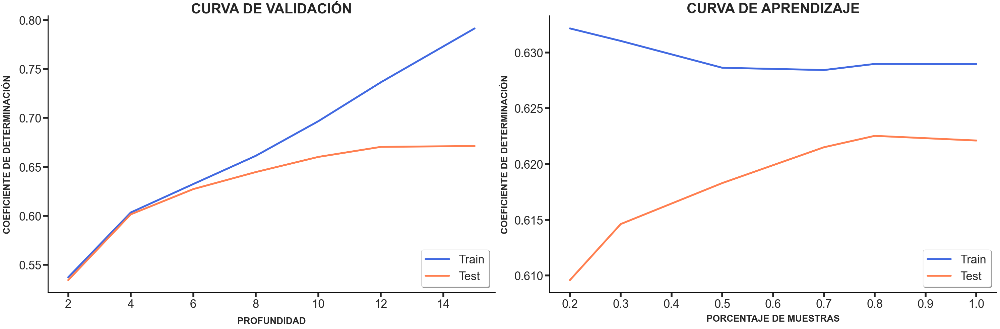

In [78]:
depths = [2, 4, 6, 8, 10, 12, 15]
sizes = [0.2, 0.3, 0.5, 0.7, 0.8, 1]
plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
train_scores, validation_scores = validation_curve(estimator=DecisionTreeRegressor(criterion='friedman_mse', random_state=5),
                                             X=X_train, y=y_train, n_jobs=-1, param_name='max_depth',
                                             param_range=depths, scoring='r2')
plt.subplot(1,2,1)
plt.plot(depths, pd.Series(train_scores.mean(axis=1), index=depths), color='royalblue', label='Train', linewidth=4)
plt.plot(depths, pd.Series(validation_scores.mean(axis=1), index=depths), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE VALIDACIÓN', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.xlabel('PROFUNDIDAD', fontsize=20, labelpad=15, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=15, weight='bold')
plt.yticks(fontsize=25)

_, train_scores, validation_scores = learning_curve(estimator=DecisionTreeRegressor(criterion='friedman_mse',
                                                                                    max_depth=6, random_state=5),
                                                    X=X, y=y, n_jobs=-1, random_state=5, scoring='r2', shuffle=True,
                                                    train_sizes=sizes)
plt.subplot(1,2,2)
plt.plot(sizes, pd.Series(train_scores.mean(axis=1), index=sizes), color='royalblue', label='Train', linewidth=4)
plt.plot(sizes, pd.Series(validation_scores.mean(axis=1), index=sizes), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE APRENDIZAJE', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.xlabel('PORCENTAJE DE MUESTRAS', fontsize=20, labelpad=10, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=10, weight='bold')
plt.yticks(fontsize=25)
plt.show()

Aquí, la profundidad del modelo que mejor se adapta, según las gráficas, es de ocho.

###### MODELO VALIDADO

Hacemos las pruebas correspondientes para nuestra profundidad seleccionada.

TRAIN:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 47003.85
ERROR ABSOLUTO MEDIO: 34356.09
COEFICIENTE DE DETERMINACIÓN: 0.66

TEST:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 48809.02
ERROR ABSOLUTO MEDIO: 35515.61
COEFICIENTE DE DETERMINACIÓN: 0.64


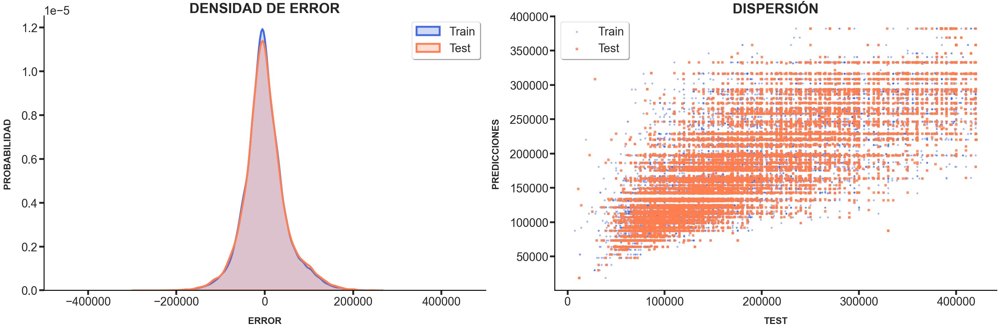

In [79]:
regressor = DecisionTreeRegressor(criterion='friedman_mse', max_depth=8, random_state=5)
regressor.fit(X_train, y_train)

y_predicciones_train = regressor.predict(X_train)
print('TRAIN:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_train, y_predicciones_train, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_train, y_predicciones_train).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_train, y_predicciones_train).round(2) }')

y_predicciones = regressor.predict(X_test)
print('\nTEST:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_test, y_predicciones, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_test, y_predicciones).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_test, y_predicciones).round(2) }')

plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
plt.subplot(1,2,1)
sns.kdeplot(y_train - y_predicciones_train, color='royalblue', fill=True, linewidth=4, label='Train')
sns.kdeplot(y_test - y_predicciones, color='coral', fill=True, linewidth=4, label='Test')
plt.title('DENSIDAD DE ERROR', fontsize=30, weight='bold')
plt.xlabel('ERROR', fontsize=20, labelpad=20, ha='center', weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PROBABILIDAD', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlim(-500000, 500000)

plt.subplot(1,2,2)
plt.scatter(y_train, y_predicciones_train, alpha=.4, color='royalblue', label='Train', marker='o', s=10)
plt.scatter(y_test, y_predicciones, alpha=.8, color='coral', label='Test', marker='s', s=15)
plt.title('DISPERSIÓN', fontsize=30, weight='bold')
plt.xlabel('TEST', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PREDICCIONES', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper left', shadow=True)
plt.show()

##### KNeighborsRegressor

###### CURVA DE VALIDACIÓN Y CURVA DE APRENDIZAJE

Realizamos la curva de validación y la curva de aprendizaje para poder evaluar los hiperparámetros que mejor se ajusten a nuestro modelo predictorio.

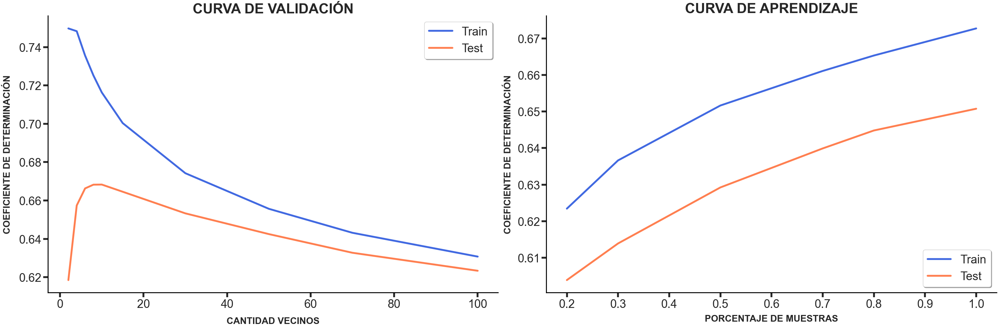

In [80]:
sizes = [0.2, 0.3, 0.5, 0.7, 0.8, 1]
neighbors = [2, 4, 6, 8, 10, 15, 30, 50, 70, 100]

plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
plt.subplot(1,2,1)
train_scores, validation_scores = validation_curve(estimator=KNeighborsRegressor(n_jobs=-1), X=X_train, y=y_train,
                                             n_jobs=-1, param_name='n_neighbors', param_range=neighbors,
                                             scoring='r2')
plt.plot(neighbors, pd.Series(train_scores.mean(axis=1), index=neighbors), color='royalblue', label='Train', linewidth=4)
plt.plot(neighbors, pd.Series(validation_scores.mean(axis=1), index=neighbors), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE VALIDACIÓN', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlabel('CANTIDAD VECINOS', fontsize=20, labelpad=15, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=15, weight='bold')
plt.yticks(fontsize=25)

_, train_scores, validation_scores = learning_curve(estimator=KNeighborsRegressor(n_jobs=-1, n_neighbors=40),
                                                    X=X, y=y, n_jobs=-1, random_state=5, scoring='r2', shuffle=True,
                                                    train_sizes=sizes)
plt.subplot(1,2,2)
plt.plot(sizes, pd.Series(train_scores.mean(axis=1), index=sizes), color='royalblue', label='Train', linewidth=4)
plt.plot(sizes, pd.Series(validation_scores.mean(axis=1), index=sizes), color='coral', label='Test', linewidth=4)
plt.title('CURVA DE APRENDIZAJE', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='lower right', shadow=True)
plt.xlabel('PORCENTAJE DE MUESTRAS', fontsize=20, labelpad=10, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('COEFICIENTE DE DETERMINACIÓN', fontsize=20, labelpad=10, weight='bold')
plt.yticks(fontsize=25)
plt.show()

En este caso, con una cantidad de vecinos igual a 40, nuestro modelo se encuentra en equilibrio.

###### MODELO VALIDADO

Analizamos el modelo con la cantidad de vecinos que analizamos previamente.

TRAIN:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 46251.64
ERROR ABSOLUTO MEDIO: 32601.87
COEFICIENTE DE DETERMINACIÓN: 0.67

TEST:
RAÍZ DEL ERROR CUADRÁTICO MEDIO: 48160.09
ERROR ABSOLUTO MEDIO: 33821.74
COEFICIENTE DE DETERMINACIÓN: 0.65


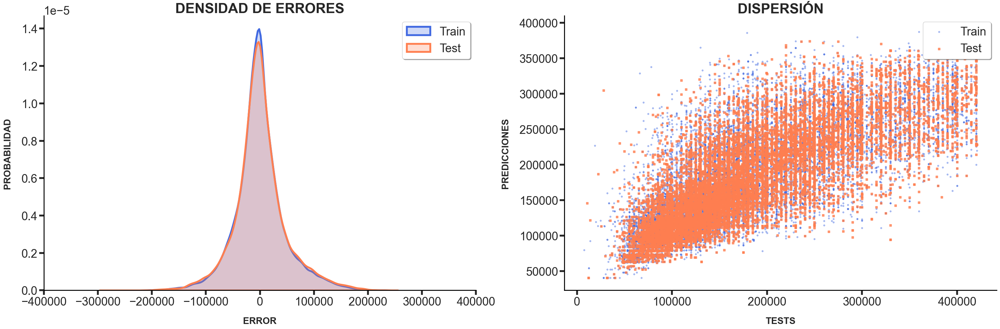

In [81]:
regressor = KNeighborsRegressor(n_neighbors=40, n_jobs=-1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
regressor.fit(X_train, y_train)

y_predicciones_train = regressor.predict(X_train)
print('TRAIN:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_train, y_predicciones_train, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_train, y_predicciones_train).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_train, y_predicciones_train).round(2) }')

y_predicciones = regressor.predict(X_test)
print('\nTEST:')
print(f'RAÍZ DEL ERROR CUADRÁTICO MEDIO: { mean_squared_error(y_test, y_predicciones, squared=False).round(2) }')
print(f'ERROR ABSOLUTO MEDIO: { mean_absolute_error(y_test, y_predicciones).round(2) }')
print(f'COEFICIENTE DE DETERMINACIÓN: { r2_score(y_test, y_predicciones).round(2) }')

plt.figure(figsize=(30,10), frameon=True, tight_layout=True, dpi=100)
plt.subplot(1,2,1)
sns.kdeplot(y_train - y_predicciones_train, color='royalblue', fill=True, linewidth=4, label='Train')
sns.kdeplot(y_test - y_predicciones, color='coral', fill=True, linewidth=4, label='Test')
plt.title('DENSIDAD DE ERRORES', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlabel('ERROR', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PROBABILIDAD', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.xlim(-400000, 400000)

plt.subplot(1,2,2)
plt.scatter(y_train, y_predicciones_train, alpha=.4, color='royalblue', label='Train', marker='o', s=10)
plt.scatter(y_test, y_predicciones, alpha=.8, color='coral', label='Test', marker='s', s=15)
plt.title('DISPERSIÓN', fontsize=30, weight='bold')
plt.legend(fontsize=25, framealpha=1, frameon=True, loc='upper right', shadow=True)
plt.xlabel('TESTS', fontsize=20, labelpad=20, weight='bold')
plt.xticks(fontsize=25)
plt.ylabel('PREDICCIONES', fontsize=20, labelpad=20, weight='bold')
plt.yticks(fontsize=25)
plt.show()

#### FINAL 

Luego de haber analizado el dataset en el cual eliminamos los registros outliers, por medio del *rango intercuartílico*, nos encontramos con poca diferencia respecto a los modelos anteriores, pero se puede apreciar que esta diferencia es perjudicial para nuestro cometido.

Aplicar esta reducción de datos, aproximadamente un 16%, y sin tener en cuenta las variables categóricas, afectamos el rendimiento de los modelos, en particular al árbol de decisión, el cual era nuestro modelo elegido para la problematica planteada. En ese punto, la eliminación de 13.303 registros, nos deja sin datos que nuestro modelo puede aprovechar para mejorar el rendimiento, de este modo, aumentamos el error de nuestro modelo en un 8%.